In [1]:
import sys
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install xraydb
!{sys.executable} -m pip install jaxopt


[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: /Users/aantes/patrick_rotation/.venv/bin/python -m pip install --upgrade pip

[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: /Users/aantes/patrick_rotation/.venv/bin/python -m pip install --upgrade pip

[notice] A new release of pip is available: 25.1.1 -> 26.0.1
[notice] To update, run: /Users/aantes/patrick_rotation/.venv/bin/python -m pip install --upgrade pip


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from cycler import cycler
from time import time

from helpers import Material, apply_psf, get_wavelen, get_wavenum

import jax
import jax.numpy as jnp

import chromatix.functional as cx
from chromatix.ops import init_plane_resample

import optax
from jaxopt.projection import projection_non_negative
from flax import linen as nn
from flax.core import unfreeze, freeze

In [3]:
# Figure settings

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar

def add_scalebar(ax, sz, Nx, real_dx, real_units, color='k', sv=1):
    width_px = sz * Nx 
    label = f'{real_dx * width_px:.0f} {real_units}'
    scalebar = AnchoredSizeBar(ax.transData, width_px, label, 'lower left', size_vertical=sv, frameon=False, color=color)
    ax.add_artist(scalebar)
    
custom_cycler = cycler('color', ['#0072B2', '#009E73', '#F0E442', '#D55E00', '#CC79A7'])  # color-blind friendly

plt.rcParams.update({
    'figure.dpi': 300,
    'font.size':10,
    'axes.titlesize':10,
    'axes.labelsize':8,
    'axes.linewidth': .5,
    'axes.prop_cycle': custom_cycler,
    'xtick.top': True, 
    'ytick.right': True, 
    'xtick.direction': 'in', 
    'ytick.direction': 'in',
    'xtick.labelsize':8,
    'ytick.labelsize':8,
    'legend.fontsize': 8,
    'lines.linewidth':1,
    'image.cmap':'gray',
    'text.usetex': True,
    'font.family': 'serif'
})

In [4]:
# Material definitions 

### from NIST
adip = Material('adipose', 'H(11.4)C(59.8)N(0.7)O(27.8)Na(0.1)S(0.1)Cl(0.1)', 0.95)
gland = Material('gland', 'H(10.2)C(18.4)N(3.2)O(67.6)', 1.05)
bone = Material('bone', 'H(3.4)C(15.5)N(4.2)O(43.5)Na(0.1)Mg(0.2)P(10.3)S(0.3)Ca(22.5)', 1.92)
tissue = Material('soft tissue', 'H(10.2)C(14.3)N(3.4)O(70.8)Na(0.2)P(0.3)S(0.3)Cl(0.2)K(0.3)', 1.06)   
breast = Material('breast tissue', 'H(10.6)C(33.2)N(3.0)O(52.7)Na(0.1)P(0.1)S(0.2)Cl(0.1)', 1.0)
water = Material('water', 'H(11.2)O(88.8)', 1.0)

### breast calcifications
# Type I: Calcium oxalate dihydrate (CaC2O4·2H2O)
calc1 = Material(
    name = 'Type I',
    matcomp = 'Ca(24.43)C(14.64)O(58.49)H(2.44)',
    density = 2.0  # effective vs 2.20  # g/cm^3
)

# Type II: Hydroxyapatite (Ca5(PO4)3OH)
calc2 = Material(
    name = 'Type II',
    matcomp = 'Ca(39.89)P(18.50)O(41.41)H(0.20)',
    density = 2.8  # effective vs 3.05  # g/cm^3 (biological apatite ~2.9–3.1)
)

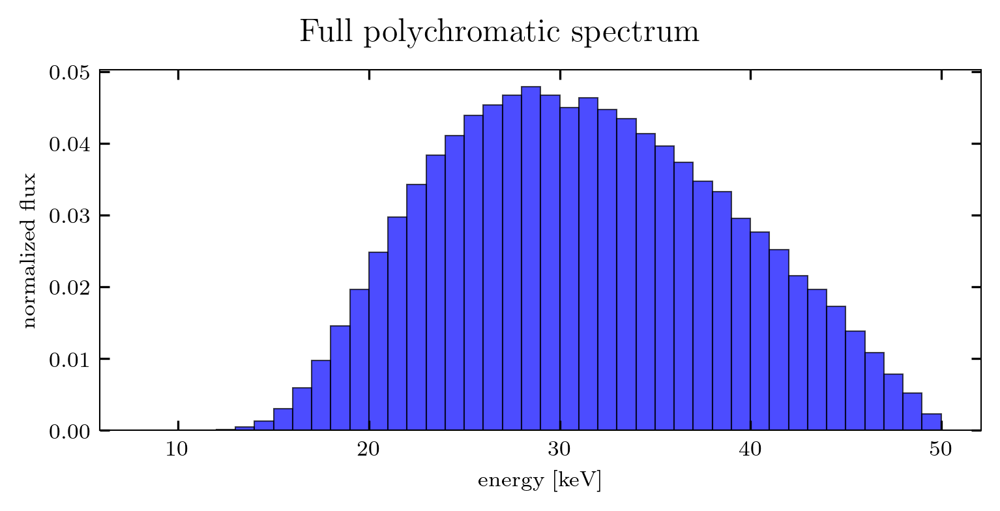

In [5]:
with open('tasmics_50kVp_2mmAl.csv', 'r') as f:
    spectrum = np.array([line.split(',') for line in f.readlines()[1:]], dtype=float).T
    spectrum = spectrum[:, spectrum[1] > 1e-3]  # remove 0s for speed
    spectrum[1] /= np.sum(spectrum[1])          # normalize total counts

fig, ax = plt.subplots(figsize=[5,2.5], dpi=300, layout='constrained')
fig.suptitle('Full polychromatic spectrum')
ax.set_ylabel('normalized flux')
ax.set_xlabel('energy [keV]')
ax.bar(spectrum[0], spectrum[1], width=1, align='center', edgecolor='k', color='b', linewidth=0.5, alpha=0.7)
plt.show()

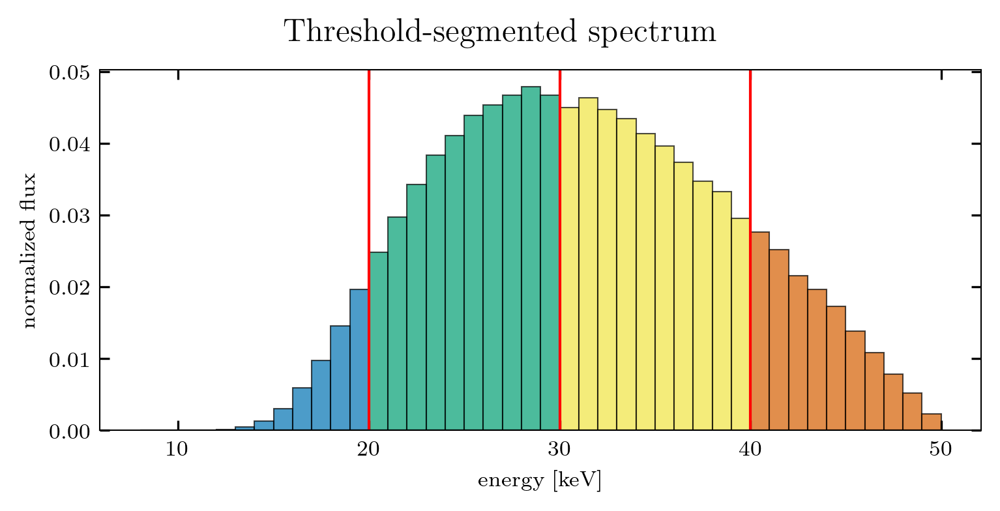

In [6]:
# Spectral imaging -- multiple detector bins

def make_binspec(energies, I0s, thresholds):
    """
    For spectral imaging, create multiple "binned" spectra, 
    i.e. the effective polychromatic spectrum detected above/below 
    an idealized energy-discriminating threshold.
    """
    E  = jnp.asarray(energies)
    I  = jnp.asarray(I0s)
    thr = jnp.sort(jnp.asarray(thresholds))
    edges = jnp.concatenate([jnp.array([-jnp.inf]), thr, jnp.array([jnp.inf])])
    lo, hi = edges[:-1][:, None], edges[1:][:, None]  # [B,1], [B,1]
    mask = (E[None, :] >= lo) & (E[None, :] < hi)     # [B,E], half-open bins
    return mask.astype(E.dtype) * I[None, :]                     


threshs = [20, 30, 40]  # example energy thresholds [keV]
specs = make_binspec(spectrum[0], spectrum[1], threshs)

fig, ax = plt.subplots(figsize=[5,2.5], dpi=300, layout='constrained')
fig.suptitle('Threshold-segmented spectrum')
ax.set_ylabel('normalized flux')
ax.set_xlabel('energy [keV]')
for i in range(len(threshs)+1):
    ax.bar(spectrum[0], specs[i], width=1, align='center', edgecolor='k', linewidth=0.5, alpha=0.7)
[ax.axvline(en, color='r') for en in threshs]
plt.show()

In [7]:
%%time 
# ANTES CODE: OPTIMIZATION OF BIN # AND THRESHOLDS
from itertools import combinations

# Hyperparams
I0_total = 1e5
det_dx   = 4e-6        # match MultiMatProjectionOpt
SNR_WEIGHT = 2       # increase to penalise splitting photons across more bins
MIN_COUNTS = 10        # minimum photons/bin/pixel to consider a config valid
E_GRID     = list(np.arange(20, 47, 0.5))   # candidate threshold positions [keV]
MATERIALS  = [calc2, breast]

# Scoring 
def score_thresholds(energies, I0s, thresholds, materials,
                     min_counts=MIN_COUNTS, snr_weight=SNR_WEIGHT):
    etas = make_binspec(energies, I0s, thresholds)
    counts_per_bin = etas.sum(axis=1)

    if jnp.any(counts_per_bin < min_counts):
        return jnp.inf

    ds = jnp.stack([m.delta_beta(energies)[0] for m in materials], axis=0)
    A  = jnp.einsum('be,me->bm', etas, ds)
    _, sv, _ = jnp.linalg.svd(A, full_matrices=False)
    cond = float(sv[0] / sv[-1])

    min_snr     = float(jnp.sqrt(counts_per_bin.min()))
    snr_penalty = 1.0 / (min_snr + 1e-6)

    return cond * (1.0 + snr_weight * snr_penalty)


energies = spectrum[0]
I0s      = I0_total * spectrum[1] * (det_dx * 1e6)**2

best_per_nbins = {}
for n_thresh in range(1, 5): # 1–4 thresholds: 2–5 bins
    candidates = {
        thrs: score_thresholds(energies, I0s, list(thrs), MATERIALS)
        for thrs in combinations(E_GRID, n_thresh)
    }
    best_thrs  = min(candidates, key=candidates.get)
    n_bins     = n_thresh + 1
    best_per_nbins[n_bins] = (list(best_thrs), candidates[best_thrs])
    print(f'{n_bins} bins | thresholds: {list(best_thrs)} | score: {candidates[best_thrs]:.3f}')

# Pick overall best
best_nbins    = min(best_per_nbins, key=lambda k: best_per_nbins[k][1])
best_thresholds, best_score = best_per_nbins[best_nbins]
print(f'{n_bins} bins | thresholds: {[int(t) for t in best_thrs]} | score: {candidates[tuple(best_thrs)]:.3f}')

E_GRID = list(range(22, 45, 2))  

2 bins | thresholds: [np.float64(26.0)] | score: 2789.641
3 bins | thresholds: [np.float64(24.0), np.float64(29.0)] | score: 2438.605
4 bins | thresholds: [np.float64(23.0), np.float64(26.0), np.float64(30.0)] | score: 2285.742
5 bins | thresholds: [np.float64(23.0), np.float64(25.0), np.float64(28.0), np.float64(31.0)] | score: 2187.161
5 bins | thresholds: [23, 25, 28, 31] | score: 2187.161
CPU times: user 4min 36s, sys: 3.73 s, total: 4min 40s
Wall time: 4min 21s


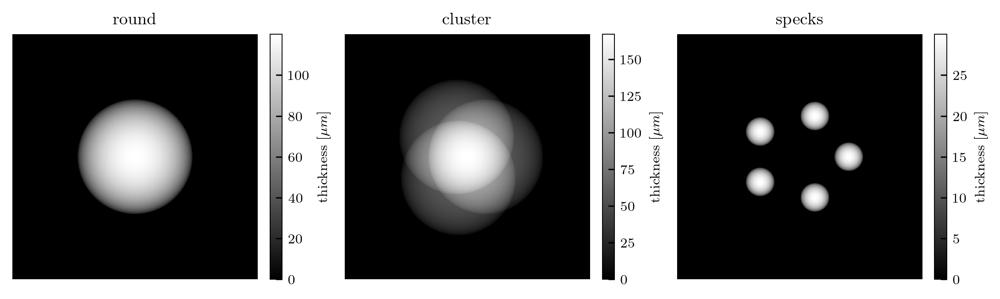

CPU times: user 497 ms, sys: 32.4 ms, total: 529 ms
Wall time: 507 ms


In [8]:
%%time

### Geometry for three types of calcifications
titles = ['round', 'cluster', 'specks']
T_round = 120e-6    # max thickness in [m]
T_cluster = 60e-6
T_speck = 30e-6

### Dimensions of the phantom
NX = 512     # number of pixels in x, y  
dx = 0.5e-6    # width of pixels in [m]
fov = NX*dx
yy, xx = jnp.meshgrid(jnp.arange(NX), jnp.arange(NX), indexing='ij')

### Create the thickness maps
# 1. round
x0 = y0 = (NX - 1) / 2
rr = jnp.sqrt((xx - x0)**2 + (yy - y0)**2)
r = 0.5 * (T_round / fov) * NX  
t_round   = T_round * jnp.sqrt(jnp.maximum(r**2 - rr**2, 0.0)) / r

# 2. cluster
t_cluster = jnp.zeros([NX, NX])
R0 = (NX - 1) / 2
for theta in [0, 2.1*np.pi/3, 4*np.pi/3]:
    x0 = R0 + R0*np.cos(theta)*.15
    y0 = R0 - R0*np.sin(theta)*.2
    rr = jnp.sqrt((xx - x0)**2 + (yy - y0)**2)
    t_cluster += T_cluster * jnp.sqrt(jnp.maximum(r**2 - rr**2, 0.0)) / r

# 3. specks
t_speck = jnp.zeros([NX, NX])
r = 0.5 * (T_speck / fov) * NX  
R0 = (NX - 1) / 2
for theta in np.linspace(0, 1.6*np.pi, 5):
    x0 = R0 + R0*np.cos(theta)*.4
    y0 = R0 - R0*np.sin(theta)*.35
    rr = jnp.sqrt((xx - x0)**2 + (yy - y0)**2)
    t_speck += T_speck * jnp.sqrt(jnp.maximum(r**2 - rr**2, 0.0)) / r

tmaps_bone = jnp.array([t_round, t_cluster, t_speck])

# temp - constant background thickness map, 2 cm
tmap_bg = 2e-2 * jnp.ones([NX, NX])

### Show the thickness maps
fig, ax = plt.subplots(1, 3, figsize=(8, 2.3), layout='constrained')
for i, tmap in enumerate(tmaps_bone):
    m = ax[i].imshow(tmap*1e6, vmin=0)  # scale by 1e6 so intensity is in microns
    ax[i].set_title(titles[i])
    ax[i].axis('off')
    fig.colorbar(m, ax=ax[i], label=r'thickness [$\mu m$]')
plt.show()

tmap_phantom_sim shape: (3, 512, 512)
data shape: (5, 48, 48)


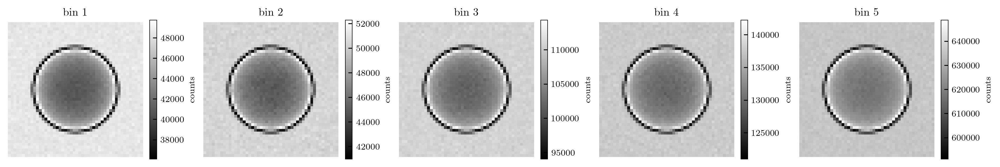

CPU times: user 6.07 s, sys: 869 ms, total: 6.94 s
Wall time: 3.09 s


In [9]:
%%time

class MultiMatProjectionSim(nn.Module):
    propdist = 50e-3
    I0_total = 1e5

    phantom_dx: float = 0.5e-6
    phantom_Nx: int = 512
    phantom_Ny: int = 512

    det_Nx: int = 64
    det_Ny: int = 64
    resampling_method: str = 'linear'
    det_crop: int = 8

    mats = (calc2, breast, breast)

    energies = spectrum[0]
    wavelens = get_wavelen(energies)

    phantom_fov: float = phantom_Nx * phantom_dx
    det_fov: float = phantom_fov
    det_dx: float = det_fov / det_Nx
    N_pad: int = 32
    n_medium: float = 1.0

    I0s = I0_total * spectrum[1] * (det_dx * 1e6)**2
    thresholds = best_thresholds
    etas = make_binspec(energies, I0s, thresholds)

    def setup(self):
        B = len(self.mats)
        self.tmap = self.param(
            'tmap',
            lambda key, shape: jnp.full(shape, 1e-9, dtype=jnp.float32),
            (B, self.phantom_Nx, self.phantom_Ny)
        )
        dbs = [m.delta_beta(self.energies) for m in self.mats]
        self.ds = jnp.stack([d for d, _ in dbs], axis=0)
        self.bs = jnp.stack([b for _, b in dbs], axis=0)
        self.det_resample_func = init_plane_resample(
            (self.det_Nx, self.det_Ny),
            (self.det_dx, self.det_dx),
            resampling_method=self.resampling_method
        )

    def __call__(self):
        field = cx.plane_wave(
            shape=(self.phantom_Nx, self.phantom_Ny),
            dx=self.phantom_dx,
            spectrum=self.wavelens,
            spectral_density=jnp.ones(self.wavelens.size)
        )
        field = field / field.intensity.max()**0.5
        cval = field.intensity.max()

        delta_proj = jnp.einsum('bxy,be->xye', self.tmap, self.ds)
        beta_proj  = jnp.einsum('bxy,be->xye', self.tmap, self.bs)

        exit_field = cx.thin_sample(field, beta_proj[None,..., None], delta_proj[None,..., None], 1)
        det_field  = cx.transfer_propagate(exit_field, self.propdist, self.n_medium, self.N_pad, cval=cval, mode='same')
        ref_field  = cx.transfer_propagate(field,      self.propdist, self.n_medium, self.N_pad, cval=cval, mode='same')

        A_obj = det_field.amplitude.squeeze((0, 4))
        A_ref = ref_field.amplitude.squeeze((0, 4))
        in_spacing = jnp.array([self.phantom_dx, self.phantom_dx], dtype=A_obj.dtype)
        A_obj_rs = self.det_resample_func(A_obj, in_spacing)
        A_ref_rs = self.det_resample_func(A_ref, in_spacing)
        imgs = (A_obj_rs / (A_ref_rs + 1e-12))**2

        dc = self.det_crop
        if dc:
            imgs = imgs[dc:self.det_Nx - dc, dc:self.det_Ny - dc, :]

        rng = self.make_rng('noise')
        imgs = jax.random.poisson(rng, imgs * self.I0s[None, None, :]).astype(imgs.dtype) \
               / (self.I0s[None, None, :] + 1e-12)
        bin_imgs = jnp.einsum('be,hwe->bhw', self.etas, imgs)

        return bin_imgs.clip(0, None)

### Initialize the model
key    = jax.random.PRNGKey(3)
model  = MultiMatProjectionSim()
params = model.init(key)

### Create sim phantom with 3 material layers matching mats = (calc2, breast, breast)
tmap_phantom_sim = jnp.stack((t_round, tmap_bg, tmap_bg), axis=0).astype(jnp.float32)
GT               = jnp.stack((t_round, tmap_bg), axis=0).astype(jnp.float32)  # 2-mat GT for plotting
print(f'tmap_phantom_sim shape: {tmap_phantom_sim.shape}')  # should be (3, 512, 512)

params = freeze({**unfreeze(params), 'params': {**unfreeze(params)['params'], 'tmap': tmap_phantom_sim}})

### Simulate data
data = model.apply(params, rngs={'noise': key})
print(f'data shape: {data.shape}')

### Show bin images
Nt = data.shape[0]
fig, ax = plt.subplots(1, Nt, figsize=[2.5*Nt, 2], layout='constrained')
for i in range(Nt):
    ax[i].set_title(f'bin {i+1}')
    m = ax[i].imshow(data[i])
    fig.colorbar(m, ax=ax[i], label='counts')
    ax[i].axis('off')
plt.show()

tmap_phantom_opt shape: (2, 48, 48)
Mat1 max:  119.9 um
Mat2 mean: 40.0 mm


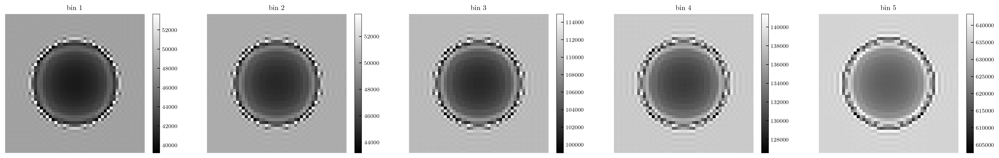

det_dx: 4.00 um
CPU times: user 2.96 s, sys: 124 ms, total: 3.09 s
Wall time: 2.28 s


In [11]:
%%time

class MultiMatProjectionOpt(nn.Module):
    propdist = 50e-3
    I0_total = 1e5

    phantom_dx: float = 4e-6
    phantom_Nx: int = 64
    phantom_Ny: int = 64

    det_Nx: int = 64
    det_Ny: int = 64
    resampling_method: str = 'linear'
    det_crop: int = 8

    mat1 = calc2
    mat2 = breast
    energies = spectrum[0]
    ds1, bs1 = mat1.delta_beta(energies)
    ds2, bs2 = mat2.delta_beta(energies)
    n1 = (ds1 + 1j*bs1) / mat1.density
    n2 = (ds2 + 1j*bs2) / mat2.density
    ds = jnp.stack((ds1, ds2), axis=0)
    bs = jnp.stack((bs1, bs2), axis=0)

    phantom_fov: float = phantom_Nx * phantom_dx
    det_fov: float = phantom_fov
    det_dx: float = det_fov / det_Nx
    wavelens = get_wavelen(energies)
    N_pad: int = 32
    n_medium: float = 1.0

    I0s = I0_total * spectrum[1] * (det_dx * 1e6)**2
    thresholds = best_thresholds
    etas = make_binspec(energies, I0s, thresholds)

    t_guess_bone_m   = 8e-7
    t_guess_tissue_m = 2.5e-2
    init_jitter_frac: float = 0.001
    init_scale: float = 1
    t_guess_bone_m *= init_scale
    t_guess_tissue_m *= init_scale

    def setup(self):
        H = self.det_Nx - 2*self.det_crop
        W = self.det_Ny - 2*self.det_crop

        def init_tmap(key, shape):
            k1, k2 = jax.random.split(key)
            bone_guess   = jnp.full((H, W), self.t_guess_bone_m,   dtype=jnp.float32)
            tissue_guess = jnp.full((H, W), self.t_guess_tissue_m, dtype=jnp.float32)
            if self.init_jitter_frac > 0:
                bone_guess   = bone_guess   + 1e-7 * jax.random.normal(k1, (H, W)).astype(jnp.float32)
                tissue_guess = tissue_guess + 1e-7 * jax.random.normal(k2, (H, W)).astype(jnp.float32)
            t0 = jnp.clip(bone_guess,   1e-8)
            t1 = jnp.clip(tissue_guess, 1e-8)
            return jnp.stack((t0, t1), axis=0)

        self.tmap = self.param('tmap', init_tmap, (2, H, W))

        self.det_resample_func = init_plane_resample(
            (self.det_Nx, self.det_Ny),
            (self.det_dx, self.det_dx),
            resampling_method=self.resampling_method
        )
        self.upsample_to_phantom = init_plane_resample(
            (self.phantom_Nx, self.phantom_Ny),
            (self.phantom_dx, self.phantom_dx),
            resampling_method='cubic'
        )

    def __call__(self):
        dc = self.det_crop
        in_spacing = jnp.array([self.det_dx, self.det_dx])
        tmap_padded = jnp.pad(self.tmap, ((0, 0), (dc, dc), (dc, dc)), mode='edge')
        tmp = self.upsample_to_phantom(jnp.moveaxis(tmap_padded, 0, -1), in_spacing)
        tmap_upx = jnp.moveaxis(tmp, -1, 0) * (self.det_dx / self.phantom_dx)**2

        field = cx.plane_wave(
            shape=(self.phantom_Nx, self.phantom_Ny),
            dx=self.phantom_dx,
            spectrum=self.wavelens,
            spectral_density=jnp.ones(self.wavelens.size)
        )
        field = field / field.intensity.max()**0.5
        cval = field.intensity.max()

        delta_proj = jnp.einsum('bxy,be->xye', tmap_upx, self.ds)
        beta_proj  = jnp.einsum('bxy,be->xye', tmap_upx, self.bs)

        exit_field = cx.thin_sample(field, beta_proj[None, ..., None],
                                    delta_proj[None, ..., None], 1)
        det_field = cx.transfer_propagate(exit_field, self.propdist, self.n_medium,
                                          self.N_pad, cval=cval, mode='same')
        ref_field = cx.transfer_propagate(field, self.propdist, self.n_medium,
                                          self.N_pad, cval=cval, mode='same')

        A_obj = det_field.amplitude.squeeze((0, 4))
        A_ref = ref_field.amplitude.squeeze((0, 4))
        in_spacing = jnp.array([self.phantom_dx, self.phantom_dx], dtype=A_obj.dtype)
        A_obj_rs = self.det_resample_func(A_obj, in_spacing)
        A_ref_rs = self.det_resample_func(A_ref, in_spacing)
        imgs = (A_obj_rs / (A_ref_rs + 1e-12))**2

        if dc:
            imgs = imgs[dc:self.det_Nx - dc, dc:self.det_Ny - dc, :]

        bin_imgs = jnp.einsum('be,hwe->bhw', self.etas, imgs)
        return bin_imgs.clip(0, None)

# build model
key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
params  = model.init(key)
forward = jax.jit(model.apply)

# build tmap_phantom_opt directly at opt resolution
Nx_opt = model.det_Nx - 2*model.det_crop  # 48
fov    = Nx_opt * model.det_dx

yy, xx = jnp.meshgrid(jnp.arange(Nx_opt), jnp.arange(Nx_opt), indexing='ij')
x0 = y0 = (Nx_opt - 1) / 2
rr = jnp.sqrt((xx - x0)**2 + (yy - y0)**2)

T_bone_center = 120e-6   # match sim t_round max exactly
r = 0.5 * (T_bone_center / fov) * Nx_opt
t_bone_opt    = T_bone_center * jnp.sqrt(jnp.maximum(r**2 - rr**2, 0.0)) / r
t_tissue_opt  = jnp.full((Nx_opt, Nx_opt), 4e-2, dtype=jnp.float32)  # 4 cm = 2 breast layers

tmap_phantom_opt = jnp.stack((t_bone_opt, t_tissue_opt), axis=0).astype(jnp.float32)

print(f'tmap_phantom_opt shape: {tmap_phantom_opt.shape}')
print(f'Mat1 max:  {float(tmap_phantom_opt[0].max())*1e6:.1f} um')   # should be 120 um
print(f'Mat2 mean: {float(tmap_phantom_opt[1].mean())*1e3:.1f} mm')  # should be 40 mm

# Insert into params for forward model check
params = freeze({**unfreeze(params), 'params': {**unfreeze(params)['params'], 'tmap': tmap_phantom_opt}})

# Visualize
test = forward(params)
fig, ax = plt.subplots(1, len(test), dpi=300, figsize=[4*len(test), 3], layout='constrained')
for i in range(len(test)):
    ax[i].set_title(f'bin {i+1}')
    m = ax[i].imshow(test[i,:,:], cmap='gray')
    fig.colorbar(m, ax=ax[i])
    ax[i].axis('off')
plt.show()

print(f'det_dx: {model.det_dx*1e6:.2f} um')

In [12]:
def poisson_nll(yhat, y, eps=1e-12):
    return jnp.mean(yhat - y * jnp.log(yhat + eps))

def TV(x, eps=1e-8):
    dx = jnp.diff(x, axis=0, append=x[-1:, :])   
    dy = jnp.diff(x, axis=1, append=x[:, -1:])   
    eps = jnp.asarray(eps, dtype=x.dtype)
    return jnp.sum(jnp.sqrt(dx*dx + dy*dy + eps*eps))
    
def L1(x):
    return jnp.sum(jnp.abs(x))

In [13]:
def plot_md_results(params, gt, cmap='viridis', show=True, match_kw=True, C=1e3):
    """
    Helper function to show ground truth (gt) vs estimated thickness maps.
    """
    tmap_est = params.get('tmap', params['params']['tmap'])  # supports both flat/nested params

    if match_kw:
        cmap = 'bwr'
        kw1 = {'cmap':'bwr', 'vmin':0, 'vmax':C * 2 * gt[0].max()}
        kw2 = {'cmap':'bwr', 'vmin':0, 'vmax':C * 2 * gt[1].max()}
    else:
        kw1 = {'cmap':cmap}
        kw2 = {'cmap':cmap}
        
    fig, axs = plt.subplots(1, 4, figsize=(12, 3), constrained_layout=True)
    ims = [
        axs[0].imshow(C * gt[0], **kw1),
        axs[1].imshow(C * tmap_est[0], **kw1),
        axs[2].imshow(C * gt[1], **kw2),
        axs[3].imshow(C * tmap_est[1], **kw2)
    ]
    titles = ['Mat1 GT', 'Mat1 est', 'Mat2 GT', 'Mat2 est']
    for ax, im, title in zip(axs, ims, titles):
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    if show:
        plt.show()
    else:
        return fig, axs

loss @ iter 100: -2.267886e+06 (t = 2.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.11e-06  / TV2 ~ 1.43e-07


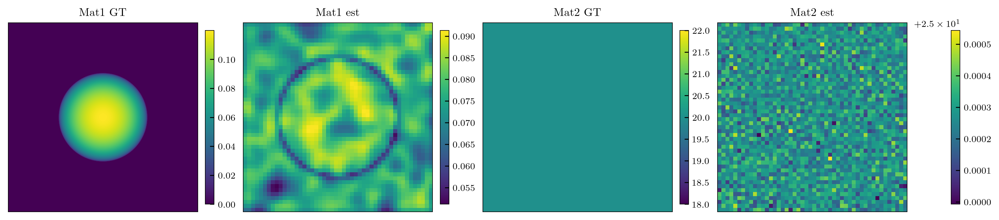

loss @ iter 200: -2.269180e+06 (t = 3.4 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.34e-06  / TV2 ~ 1.43e-07


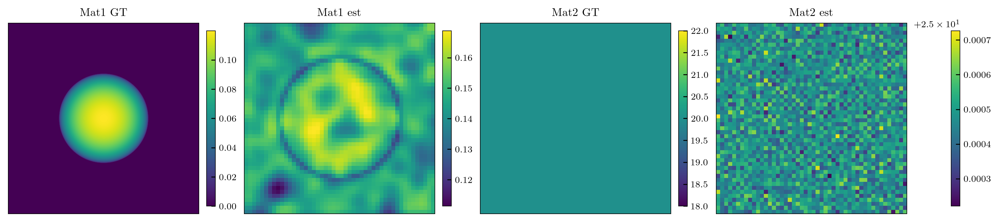

loss @ iter 300: -2.269970e+06 (t = 4.8 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.13e-06  / TV2 ~ 1.42e-07


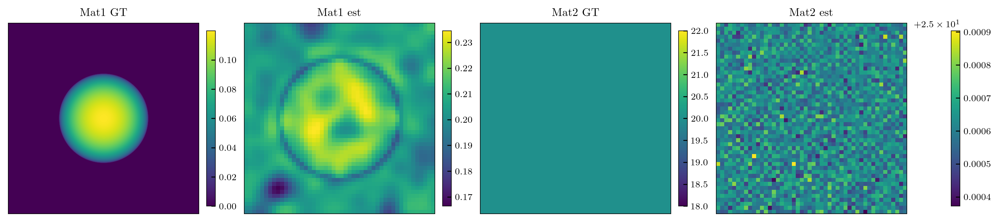

loss @ iter 400: -2.270421e+06 (t = 6.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 3.87e-06  / TV2 ~ 1.39e-07


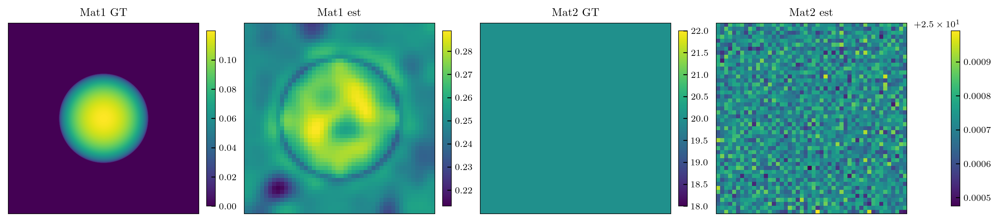

loss @ iter 500: -2.270662e+06 (t = 7.4 s)
Fidelity ~ -2.27e+06  / TV1 ~ 3.73e-06  / TV2 ~ 1.37e-07


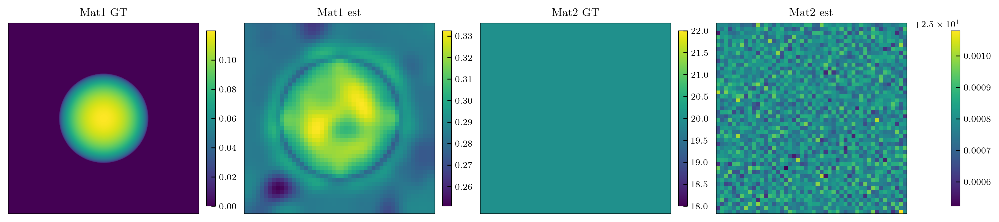

loss @ iter 600: -2.270783e+06 (t = 8.7 s)
Fidelity ~ -2.27e+06  / TV1 ~ 3.74e-06  / TV2 ~ 1.42e-07


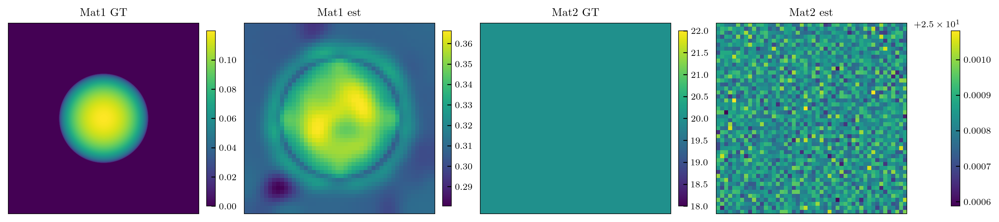

loss @ iter 700: -2.270842e+06 (t = 10.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 3.85e-06  / TV2 ~ 1.37e-07


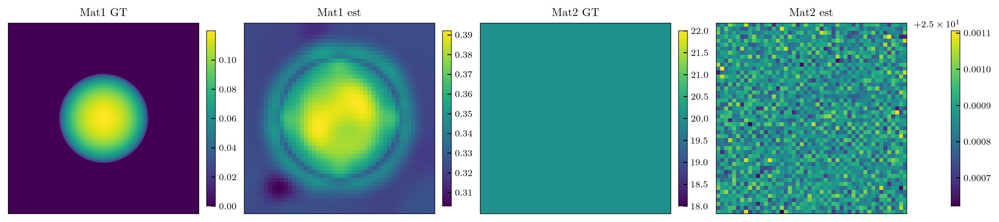

loss @ iter 800: -2.270868e+06 (t = 11.5 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.07e-06  / TV2 ~ 1.36e-07


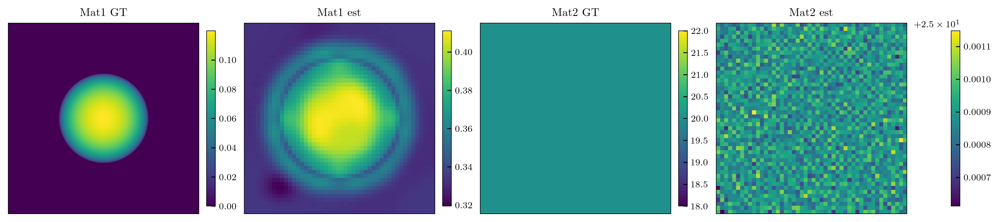

loss @ iter 900: -2.270880e+06 (t = 12.9 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.32e-06  / TV2 ~ 1.40e-07


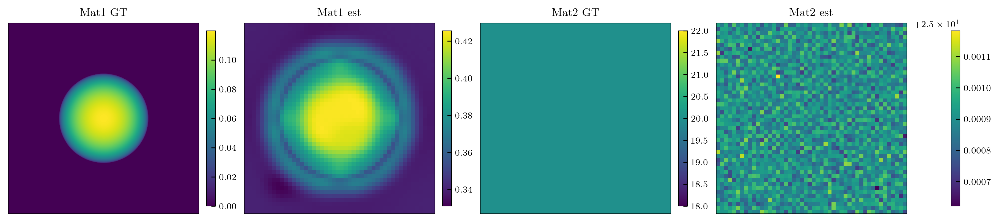

loss @ iter 1000: -2.270885e+06 (t = 14.2 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.55e-06  / TV2 ~ 1.39e-07


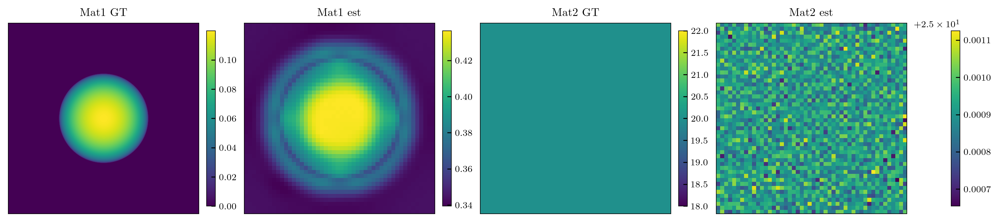

loss @ iter 1100: -2.270886e+06 (t = 15.6 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.76e-06  / TV2 ~ 1.39e-07


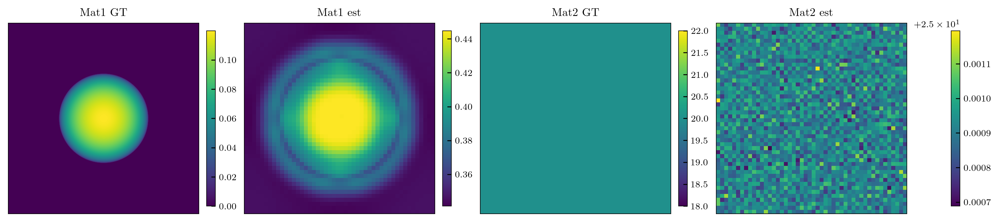

loss @ iter 1200: -2.270887e+06 (t = 16.9 s)
Fidelity ~ -2.27e+06  / TV1 ~ 4.94e-06  / TV2 ~ 1.40e-07


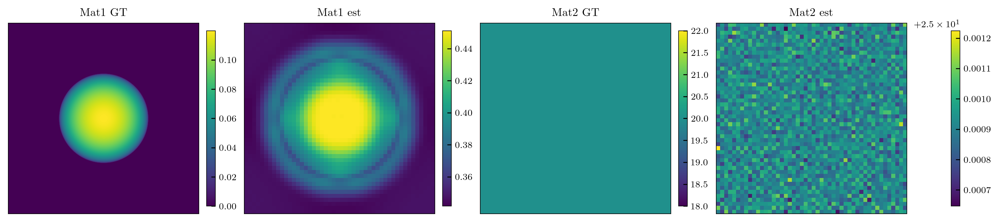

loss @ iter 1300: -2.270888e+06 (t = 18.2 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.07e-06  / TV2 ~ 1.39e-07


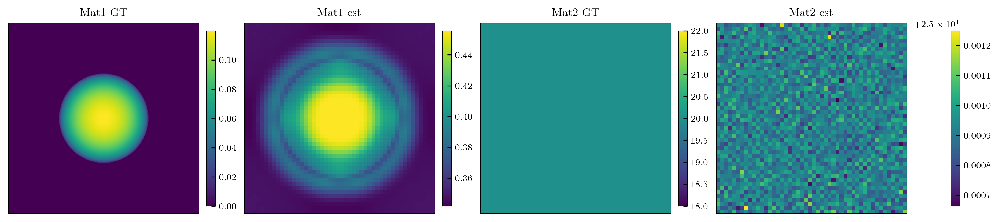

loss @ iter 1400: -2.270888e+06 (t = 19.5 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.16e-06  / TV2 ~ 1.34e-07


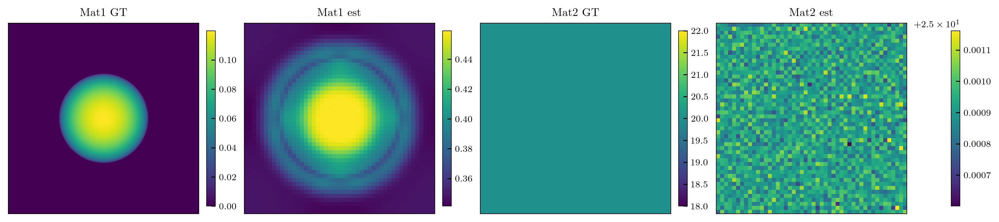

loss @ iter 1500: -2.270887e+06 (t = 20.8 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.23e-06  / TV2 ~ 1.37e-07


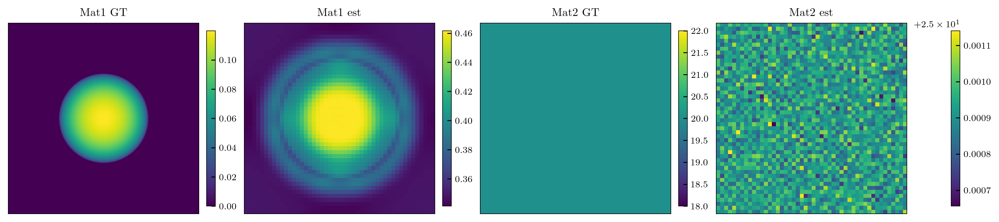

loss @ iter 1600: -2.270888e+06 (t = 22.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.28e-06  / TV2 ~ 1.39e-07


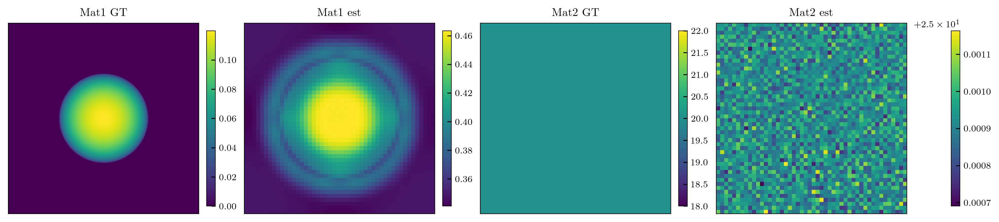

loss @ iter 1700: -2.270888e+06 (t = 23.4 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.31e-06  / TV2 ~ 1.41e-07


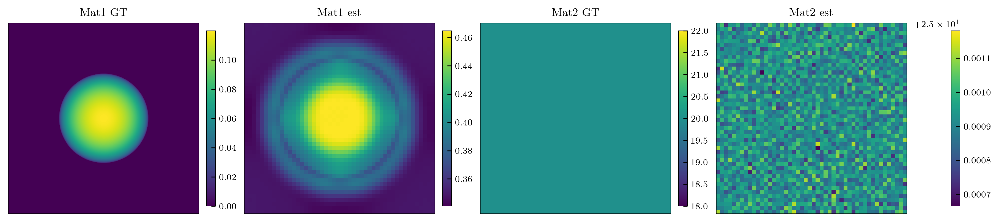

loss @ iter 1800: -2.270888e+06 (t = 24.7 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.34e-06  / TV2 ~ 1.37e-07


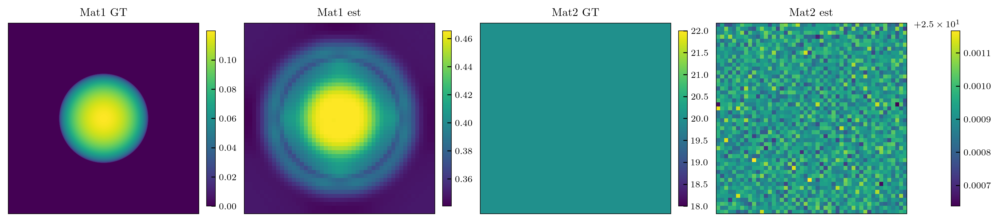

loss @ iter 1900: -2.270888e+06 (t = 26.0 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.35e-06  / TV2 ~ 1.42e-07


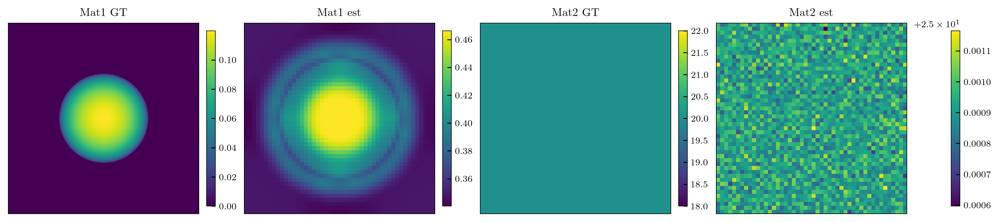

loss @ iter 2000: -2.270887e+06 (t = 27.4 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.36e-06  / TV2 ~ 1.39e-07


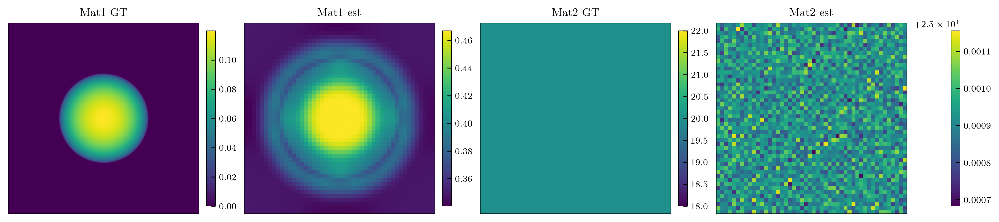

loss @ iter 2100: -2.270887e+06 (t = 28.7 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.37e-06  / TV2 ~ 1.43e-07


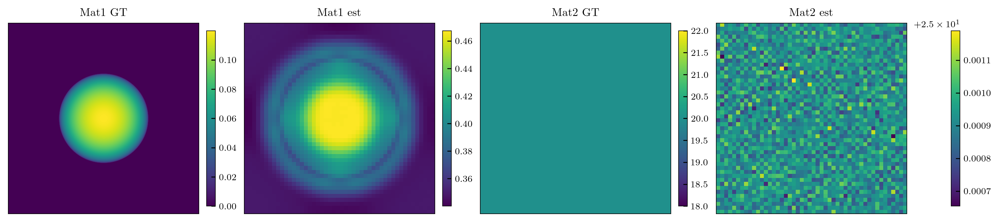

loss @ iter 2200: -2.270888e+06 (t = 30.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.38e-06  / TV2 ~ 1.40e-07


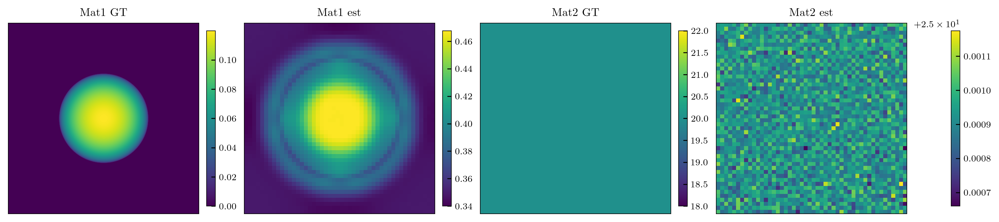

loss @ iter 2300: -2.270888e+06 (t = 31.4 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.38e-06  / TV2 ~ 1.39e-07


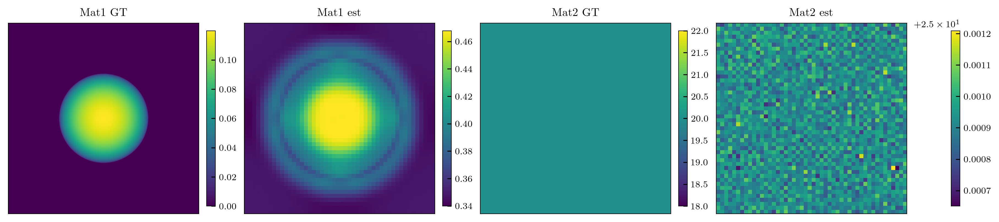

loss @ iter 2400: -2.270887e+06 (t = 32.9 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.38e-06  / TV2 ~ 1.39e-07


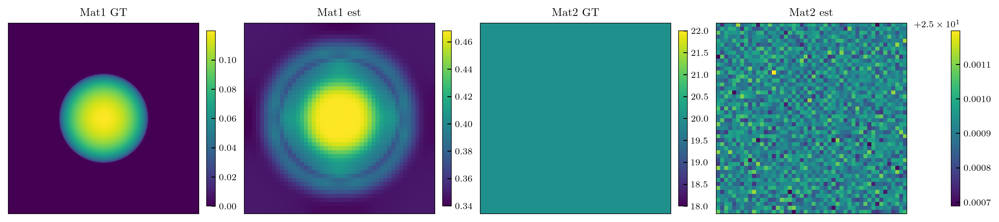

loss @ iter 2500: -2.270888e+06 (t = 34.3 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.38e-07


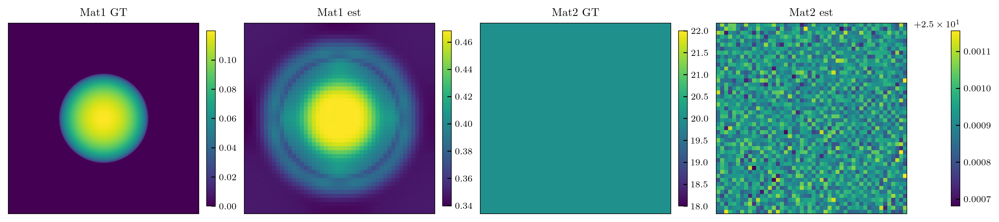

loss @ iter 2600: -2.270888e+06 (t = 35.6 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.37e-07


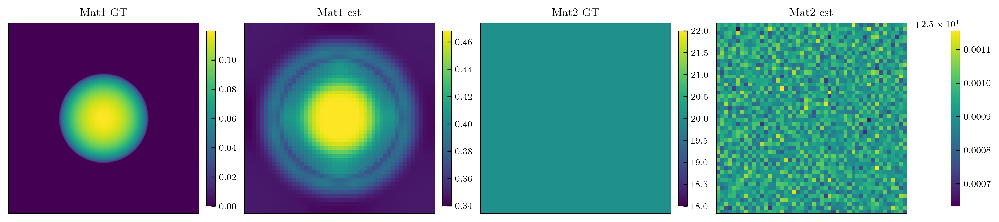

loss @ iter 2700: -2.270887e+06 (t = 37.0 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.36e-07


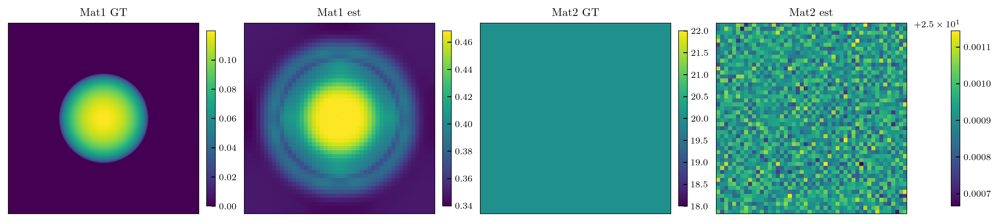

loss @ iter 2800: -2.270888e+06 (t = 38.2 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.37e-07


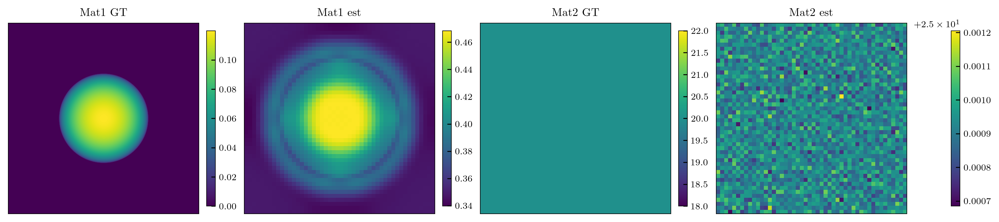

loss @ iter 2900: -2.270888e+06 (t = 39.5 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.34e-07


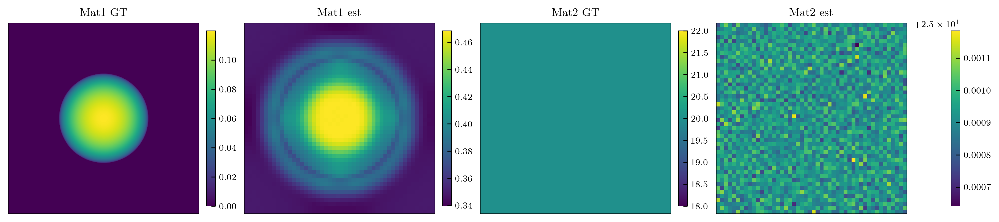

loss @ iter 3000: -2.270888e+06 (t = 40.9 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.37e-07


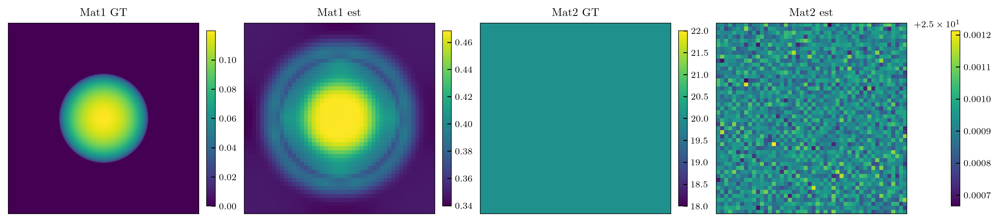

loss @ iter 3100: -2.270887e+06 (t = 42.2 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.37e-07


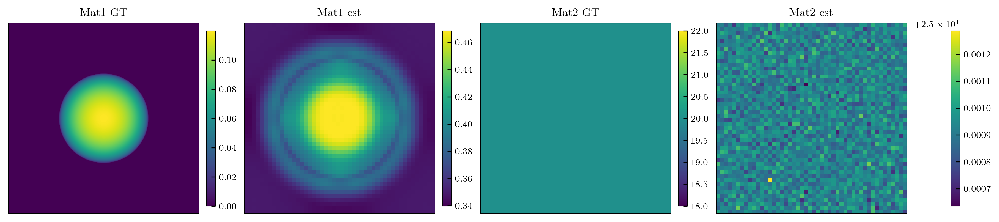

loss @ iter 3200: -2.270887e+06 (t = 43.6 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.35e-07


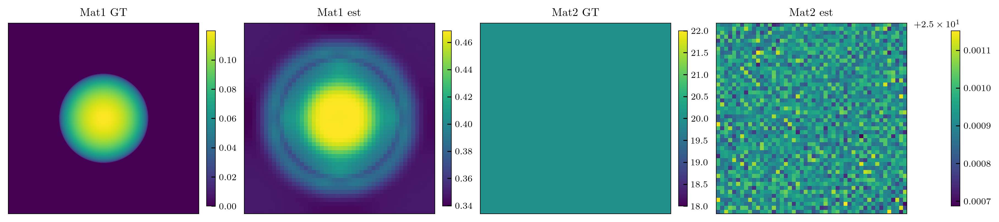

loss @ iter 3300: -2.270887e+06 (t = 44.9 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.35e-07


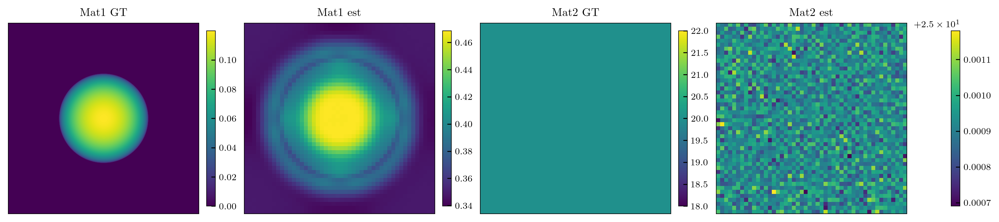

loss @ iter 3400: -2.270888e+06 (t = 46.2 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.36e-07


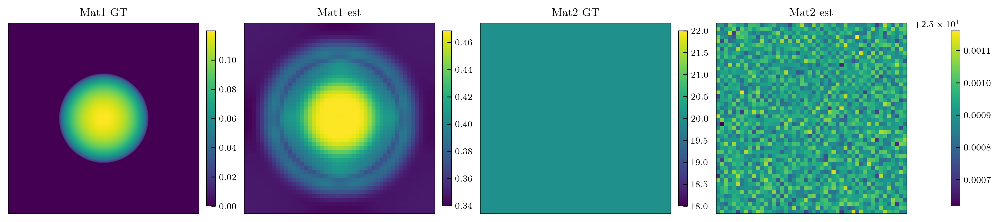

loss @ iter 3500: -2.270888e+06 (t = 47.5 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.37e-07


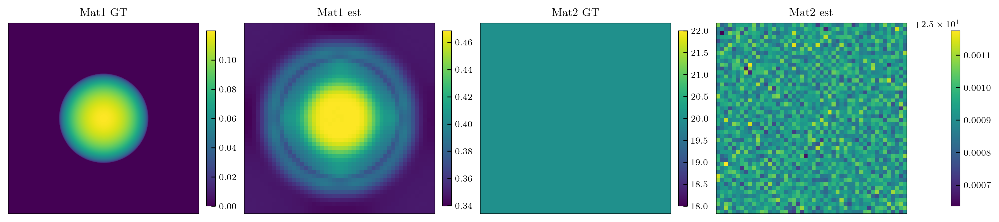

loss @ iter 3600: -2.270888e+06 (t = 48.8 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.40e-07


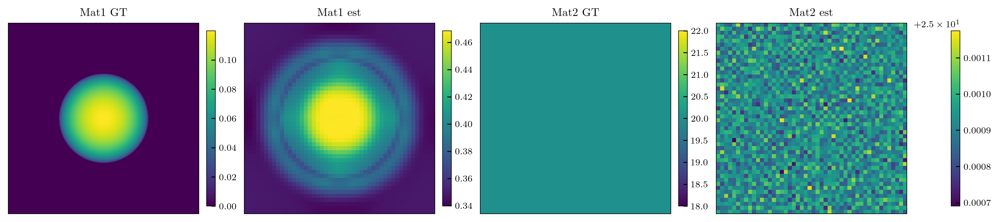

loss @ iter 3700: -2.270888e+06 (t = 50.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.30e-07


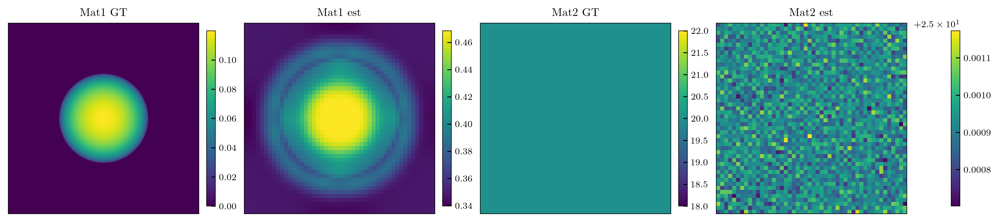

loss @ iter 3800: -2.270888e+06 (t = 51.4 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.37e-07


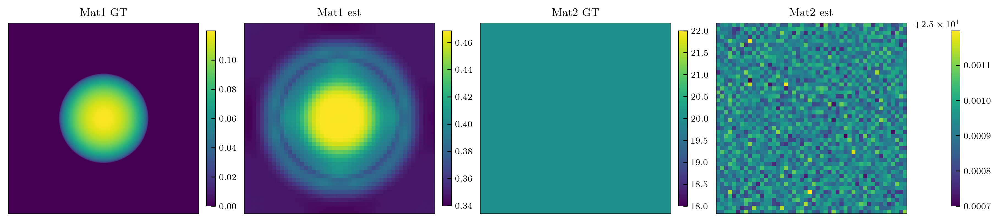

loss @ iter 3900: -2.270888e+06 (t = 52.8 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.35e-07


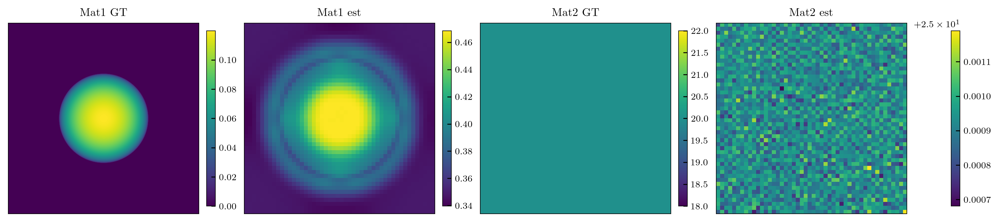

loss @ iter 4000: -2.270888e+06 (t = 54.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.36e-07


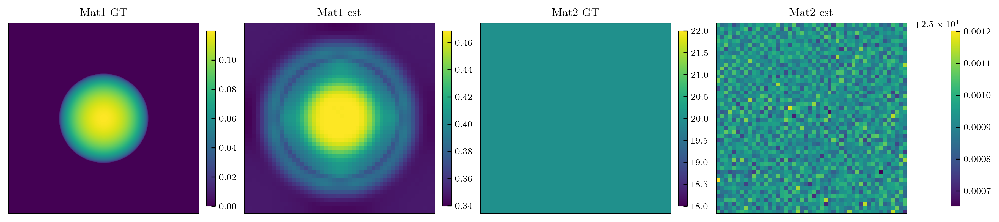

loss @ iter 4100: -2.270888e+06 (t = 55.5 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.40e-07


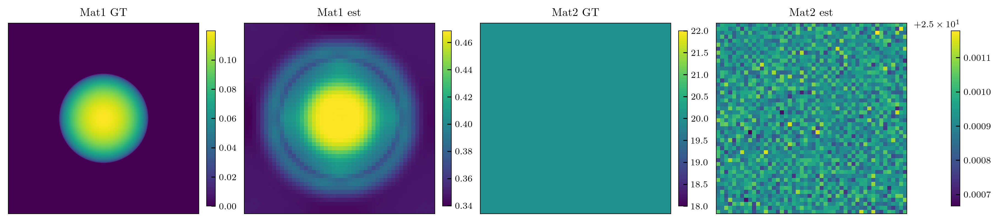

loss @ iter 4200: -2.270888e+06 (t = 56.7 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.42e-07


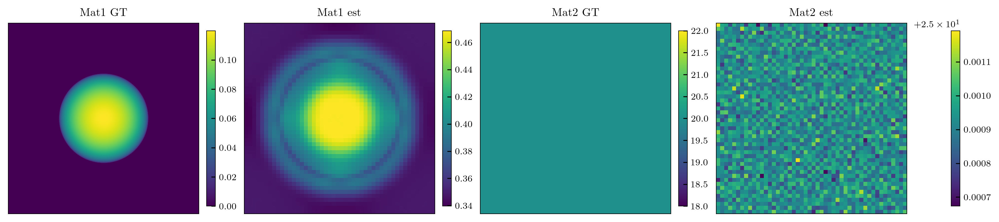

loss @ iter 4300: -2.270888e+06 (t = 58.0 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.39e-07


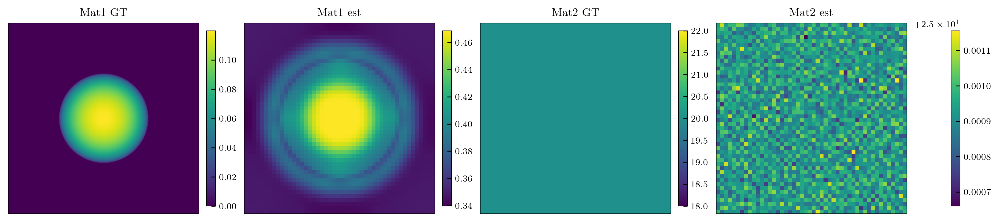

loss @ iter 4400: -2.270888e+06 (t = 59.3 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.39e-07


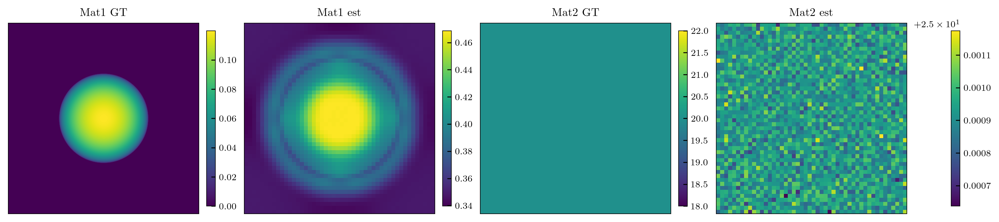

loss @ iter 4500: -2.270888e+06 (t = 60.6 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.40e-07


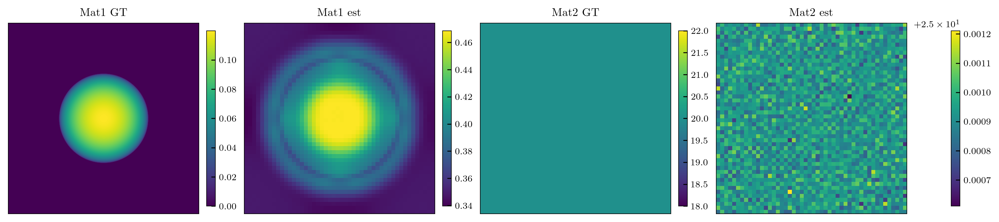

loss @ iter 4600: -2.270888e+06 (t = 61.9 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.40e-07


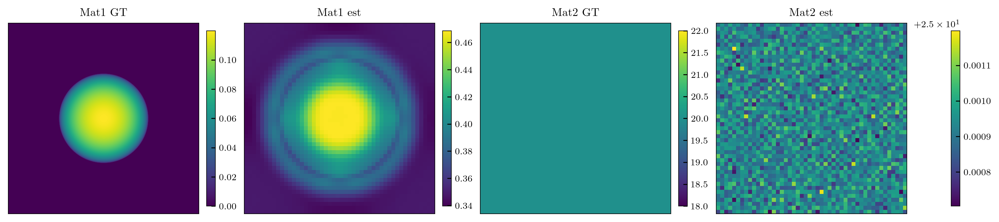

loss @ iter 4700: -2.270887e+06 (t = 63.2 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.37e-07


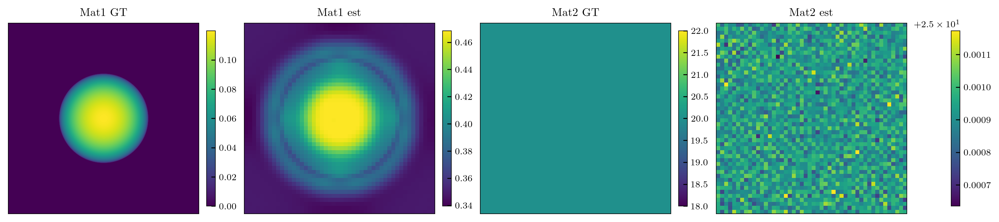

loss @ iter 4800: -2.270888e+06 (t = 64.5 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.37e-07


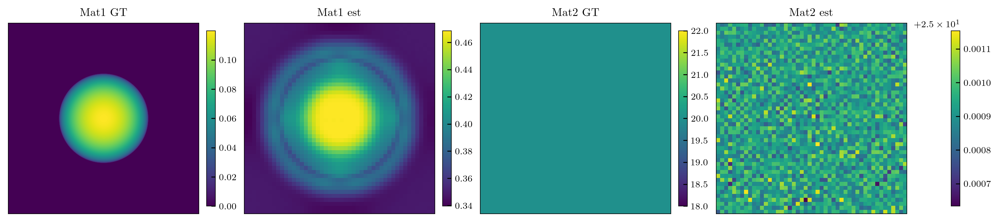

loss @ iter 4900: -2.270888e+06 (t = 65.8 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.40e-06  / TV2 ~ 1.38e-07


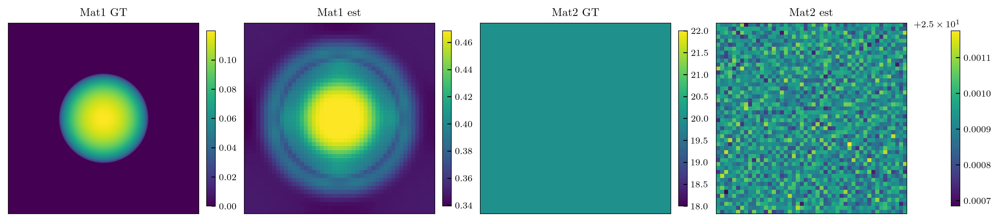

loss @ iter 5000: -2.270888e+06 (t = 67.1 s)
Fidelity ~ -2.27e+06  / TV1 ~ 5.39e-06  / TV2 ~ 1.38e-07


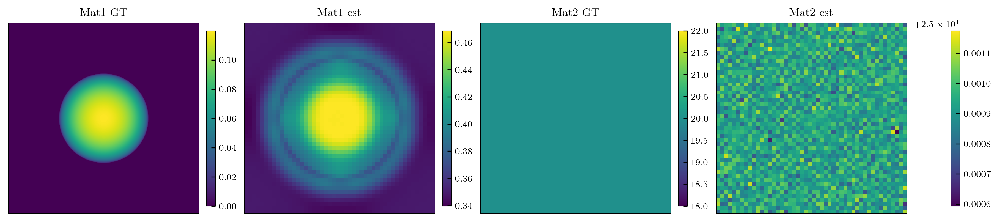

CPU times: user 1min 56s, sys: 14.3 s, total: 2min 10s
Wall time: 1min 7s


In [14]:
%%time

# Hyperparams
LRATE =1e-6
max_iter = 5000
show_iter = 100

#original:
#w_tv1 = 1e5
#w_tv2 = w_tv1

# best so far:
w_tv1 = 1e6 
w_tv2 = 1e8


# Model / params / optimizer

def loss_fn(params, data):
    tmap = params.get('tmap', params['params']['tmap'])
    t1, t2 = tmap[0], tmap[1]
    y_k = forward(params)
    fidelity = poisson_nll(y_k, data)
    tv1 = w_tv1 * TV(t1) / t1.size
    tv2 = w_tv2 * TV(t2) / t2.size

    # Penalise correlation between material maps
    t1_c = t1 - t1.mean()
    t2_c = t2 - t2.mean()
    cross = jnp.sum(t1_c * t2_c)**2 / (jnp.sum(t1_c**2) * jnp.sum(t2_c**2) + 1e-12)
    cross_penalty = 1e3 * cross

    return fidelity + tv1 + tv2 + cross_penalty


##
key = jax.random.PRNGKey(3)
model = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

##
params = model.init(key)
##

optimizer = optax.chain(
    optax.clip_by_global_norm(5.0),
    optax.adam(learning_rate=LRATE, eps=1e-8),
)
opt_state = optimizer.init(params)


@jax.jit
def update(params, opt_state, *args):
    loss, grads = jax.value_and_grad(loss_fn)(params, *args)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = projection_non_negative(optax.apply_updates(params, updates))
    return params, opt_state, loss


# Train
loss_history = []
t0 = time()
for k in range(max_iter + 1):

    params, opt_state, loss_k = update(params, opt_state, data)
    loss_history.append(float(loss_k))

    if k % show_iter == 0 and k > 0:
        t1, t2 = params['params']['tmap']
        y0 = forward(params); tv1 = TV(t1)/t1.size; tv2 = TV(t2)/t2.size
        fidel = jnp.mean(y0 - data * jnp.log(y0 + 1e-12))
        print(f'loss @ iter {k}: {loss_k:.6e} (t = {time()-t0:.1f} s)')
        print(f'Fidelity ~ {fidel:8.2e}  / TV1 ~ {tv1:6.2e}  / TV2 ~ {tv2:6.2e}')
        plot_md_results(params, GT, match_kw=False)

In [ ]:
#check how well params work:
# 1. Loss curve
fig, axes = plt.subplots(1, 2, figsize=[10, 2.5], dpi=150, layout='constrained')

# Linear scale
axes[0].plot(loss_history)
axes[0].set_xlabel('iteration')
axes[0].set_ylabel('loss')
axes[0].set_title('Convergence (linear)')

# Plot relative improvement instead of absolute value
loss_arr = np.array(loss_history)
rel_improvement = (loss_arr - loss_arr[0]) / abs(loss_arr[0])  # should be negative = improving
axes[1].plot(rel_improvement)
axes[1].set_xlabel('iteration')
axes[1].set_ylabel('relative change from init')
axes[1].set_title('Relative improvement')

plt.show()

# Key check: is loss still decreasing at the end?
window = 500
early = np.mean(loss_history[:window])
late  = np.mean(loss_history[-window:])
print(f'Mean loss first {window} iters: {early:.2f}')
print(f'Mean loss last  {window} iters: {late:.2f}')
print(f'Improvement: {(late - early) / abs(early) * 100:.2f}%')
print(f'Converged: {abs(late - early) / abs(early) < 0.01}')  # <1% change = converged
# 2. Residuals (data vs recon)
y_recon = forward(params)
fig, axes = plt.subplots(2, data.shape[0], figsize=[3*data.shape[0], 5],
                          dpi=150, layout='constrained')
for i in range(data.shape[0]):
    axes[0, i].imshow(data[i], cmap='gray')
    axes[0, i].set_title(f'data bin {i+1}')
    axes[0, i].axis('off')
    im = axes[1, i].imshow(y_recon[i] - data[i], cmap='bwr',
                            vmin=-0.05, vmax=0.05)
    axes[1, i].set_title(f'residual bin {i+1}')
    axes[1, i].axis('off')
    fig.colorbar(im, ax=axes[1, i], fraction=0.046)
plt.show()

# 3. Quantitative metrics vs GT
t1_est, t2_est = params['params']['tmap']
t1_gt, t2_gt = tmap_phantom_opt[0], tmap_phantom_opt[1]

def rmse(a, b):
    return float(jnp.sqrt(jnp.mean((a - b)**2)))

def rel_err(a, b):
    return float(jnp.mean(jnp.abs(a - b)) / (jnp.mean(jnp.abs(b)) + 1e-12))

def psnr(a, b):
    mse = jnp.mean((a - b)**2)
    return float(10 * jnp.log10(b.max()**2 / (mse + 1e-12)))

print('Material 1 (bone):')
print(f'  RMSE    = {rmse(t1_est, t1_gt)*1e6:.2f} um')
print(f'  Rel err = {rel_err(t1_est, t1_gt)*100:.1f} %')
print(f'  PSNR    = {psnr(t1_est, t1_gt):.1f} dB')

print('Material 2 (tissue):')
print(f'  RMSE    = {rmse(t2_est, t2_gt)*1e3:.2f} mm')
print(f'  Rel err = {rel_err(t2_est, t2_gt)*100:.1f} %')
print(f'  PSNR    = {psnr(t2_est, t2_gt):.1f} dB')

# 4. Profile slice through centre 
mid = t1_est.shape[0] // 2
fig, axes = plt.subplots(1, 2, figsize=[8, 3], dpi=150, layout='constrained')
axes[0].plot(t1_gt[mid]*1e6,  label='GT',  color='k')
axes[0].plot(t1_est[mid]*1e6, label='est', color='r', linestyle='--')
axes[0].set_title('Material 1 centre slice')
axes[0].set_ylabel('thickness [um]')
axes[0].legend()

axes[1].plot(t2_gt[mid]*1e3,  label='GT',  color='k')
axes[1].plot(t2_est[mid]*1e3, label='est', color='r', linestyle='--')
axes[1].set_title('Material 2 centre slice')
axes[1].set_ylabel('thickness [mm]')
axes[1].legend()
plt.show()


# Check if reconstruction actually matches data
y_recon = forward(params)
print(f'Data mean:  {float(data.mean()):.4f}')
print(f'Recon mean: {float(y_recon.mean()):.4f}')
print(f'Max abs residual: {float(jnp.abs(y_recon - data).max()):.4f}')
print(f'Mean abs residual: {float(jnp.abs(y_recon - data).mean()):.4f}')

In [ ]:
%%time
LRATE    = 1e-6
max_iter = 200
w_sweep = list(np.logspace(4, 10, 20))  # 20 values from 1e4 to 1e10

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

fidelities = []
tvs        = []

for w in w_sweep:
    w_tv1 = w_tv2 = w
    print(f'w_tv = {w:.0e}')

    def loss_fn(params, data):
        tmap = params.get('tmap', params['params']['tmap'])
        t1, t2 = tmap[0], tmap[1]
        y_k = forward(params)
        fidelity = poisson_nll(y_k, data)
        tv1 = w_tv1 * TV(t1) / t1.size
        tv2 = w_tv2 * TV(t2) / t2.size
        return fidelity + tv1 + tv2

    params    = model.init(key)
    optimizer = optax.chain(
        optax.clip_by_global_norm(5.0),
        optax.adam(learning_rate=LRATE, eps=1e-8),
    )
    opt_state = optimizer.init(params)

    @jax.jit
    def update(params, opt_state, *args):
        loss, grads = jax.value_and_grad(loss_fn)(params, *args)
        updates, opt_state = optimizer.update(grads, opt_state, params)
        params = projection_non_negative(optax.apply_updates(params, updates))
        return params, opt_state, loss

    for k in range(max_iter + 1):
        params, opt_state, loss_k = update(params, opt_state, data)

    # Record final fidelity and TV at convergence
    t1, t2 = params['params']['tmap']
    y0     = forward(params)
    fidel  = float(jnp.mean(y0 - data * jnp.log(y0 + 1e-12)))
    tv_val = float((TV(t1)/t1.size + TV(t2)/t2.size) / 2)
    fidelities.append(fidel)
    tvs.append(tv_val)
    print(f'  fidelity={fidel:.3e}  TV={tv_val:.3e}')

# L-curve: plot and find corner
fidelities = np.array(fidelities)
tvs        = np.array(tvs)

# Normalize both axes to [0,1] then find point closest to origin (corner)
f_norm = (fidelities - fidelities.min()) / (fidelities.max() - fidelities.min() + 1e-12)
t_norm = (tvs        - tvs.min())        / (tvs.max()        - tvs.min()        + 1e-12)
corner_idx   = int(np.argmin(f_norm**2 + t_norm**2))
best_w       = w_sweep[corner_idx]
print(f'\nBest w_tv = {best_w:.0e} (L-curve corner)')

# Plot L-curve
fig, ax = plt.subplots(figsize=[4, 3], dpi=150, layout='constrained')
ax.plot(tvs, fidelities, 'o-k')
ax.plot(tvs[corner_idx], fidelities[corner_idx], 'ro', markersize=8, label=f'best: {best_w:.0e}')
for i, w in enumerate(w_sweep):
    ax.annotate(f'{w:.0e}', (tvs[i], fidelities[i]), textcoords='offset points', xytext=(5,3), fontsize=7)
ax.set_xlabel('TV (regularization)')
ax.set_ylabel('Fidelity')
ax.set_title('L-curve')
ax.legend()
plt.show()


In [ ]:
#ANTES CODE FINE SWEEP V1

LRATE    = 1e-6
max_iter = 200
w_sweep = list(np.logspace(6, 8, 50))  # 20 values from 1e4 to 1e10

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

fidelities = []
tvs        = []

for w in w_sweep:
    w_tv1 = w_tv2 = w
    print(f'w_tv = {w:.0e}')

    def loss_fn(params, data):
        tmap = params.get('tmap', params['params']['tmap'])
        t1, t2 = tmap[0], tmap[1]
        y_k = forward(params)
        fidelity = poisson_nll(y_k, data)
        tv1 = w_tv1 * TV(t1) / t1.size
        tv2 = w_tv2 * TV(t2) / t2.size
        return fidelity + tv1 + tv2

    params    = model.init(key)
    optimizer = optax.chain(
        optax.clip_by_global_norm(5.0),
        optax.adam(learning_rate=LRATE, eps=1e-8),
    )
    opt_state = optimizer.init(params)

    @jax.jit
    def update(params, opt_state, *args):
        loss, grads = jax.value_and_grad(loss_fn)(params, *args)
        updates, opt_state = optimizer.update(grads, opt_state, params)
        params = projection_non_negative(optax.apply_updates(params, updates))
        return params, opt_state, loss

    for k in range(max_iter + 1):
        params, opt_state, loss_k = update(params, opt_state, data)

    # Record final fidelity and TV at convergence
    t1, t2 = params['params']['tmap']
    y0     = forward(params)
    fidel  = float(jnp.mean(y0 - data * jnp.log(y0 + 1e-12)))
    tv_val = float((TV(t1)/t1.size + TV(t2)/t2.size) / 2)
    fidelities.append(fidel)
    tvs.append(tv_val)
    print(f'  fidelity={fidel:.3e}  TV={tv_val:.3e}')

# L-curve: plot and find corner 
fidelities = np.array(fidelities)
tvs        = np.array(tvs)

# Normalize both axes to [0,1] then find point closest to origin (corner)
f_norm = (fidelities - fidelities.min()) / (fidelities.max() - fidelities.min() + 1e-12)
t_norm = (tvs        - tvs.min())        / (tvs.max()        - tvs.min()        + 1e-12)
corner_idx   = int(np.argmin(f_norm**2 + t_norm**2))
best_w       = w_sweep[corner_idx]
print(f'\nBest w_tv = {best_w:.0e} (L-curve corner)')

# Plot L-curve
fig, ax = plt.subplots(figsize=[4, 3], dpi=150, layout='constrained')
ax.plot(tvs, fidelities, 'o-k')
ax.plot(tvs[corner_idx], fidelities[corner_idx], 'ro', markersize=8, label=f'best: {best_w:.0e}')
for i, w in enumerate(w_sweep):
    ax.annotate(f'{w:.0e}', (tvs[i], fidelities[i]), textcoords='offset points', xytext=(5,3), fontsize=7)
ax.set_xlabel('TV (regularization)')
ax.set_ylabel('Fidelity')
ax.set_title('L-curve')
ax.legend()
plt.show()


In [ ]:
#ANTES CODE FINE SWEEP V2
%%time
# Hyperparams
w_tv1 = w_tv2 = best_w       # from previous L-curve
max_iter      = 200
lrate_sweep   = list(np.logspace(-7, -4, 15))  # 1e-7 → 1e-4, 15 steps

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

fidelities  = []
tvs         = []
loss_curves = []
diverged    = []

for LRATE in lrate_sweep:
    print(f'LRATE = {LRATE:.2e}')

    def loss_fn(params, data):
        tmap = params.get('tmap', params['params']['tmap'])
        t1, t2 = tmap[0], tmap[1]
        y_k = forward(params)
        fidelity = poisson_nll(y_k, data)
        tv1 = w_tv1 * TV(t1) / t1.size
        tv2 = w_tv2 * TV(t2) / t2.size
        return fidelity + tv1 + tv2

    params    = model.init(key)
    optimizer = optax.chain(
        optax.clip_by_global_norm(5.0),
        optax.adam(learning_rate=LRATE, eps=1e-8),
    )
    opt_state = optimizer.init(params)

    @jax.jit
    def update(params, opt_state, *args):
        loss, grads = jax.value_and_grad(loss_fn)(params, *args)
        updates, opt_state = optimizer.update(grads, opt_state, params)
        params = projection_non_negative(optax.apply_updates(params, updates))
        return params, opt_state, loss

    loss_curve = []
    did_diverge = False
    for k in range(max_iter + 1):
        params, opt_state, loss_k = update(params, opt_state, data)
        loss_curve.append(float(loss_k))
        if not jnp.isfinite(loss_k) or loss_k > 1e12:
            print(f'  diverged at iter {k}')
            did_diverge = True
            break

    loss_curves.append(loss_curve)
    diverged.append(did_diverge)

    if not did_diverge:
        t1, t2 = params['params']['tmap']
        y0     = forward(params)
        fidel  = float(jnp.mean(y0 - data * jnp.log(y0 + 1e-12)))
        tv_val = float((TV(t1)/t1.size + TV(t2)/t2.size) / 2)
        fidelities.append(fidel)
        tvs.append(tv_val)
        print(f'  fidelity={fidel:.3e}  TV={tv_val:.3e}')
    else:
        fidelities.append(jnp.inf)
        tvs.append(jnp.inf)

#  Plot loss curves
fig, axes = plt.subplots(1, 2, figsize=[12, 3], dpi=150, layout='constrained')

ax = axes[0]
for i, (LRATE, curve) in enumerate(zip(lrate_sweep, loss_curves)):
    label = f'{LRATE:.1e}' + (' (diverged)' if diverged[i] else '')
    ls    = '--' if diverged[i] else '-'
    ax.plot(curve, label=label, linestyle=ls)
ax.set_xlabel('iteration')
ax.set_ylabel('loss')
ax.set_title('Loss curves per LRATE')
ax.legend(fontsize=6, ncol=2)

# Pick best: highest LRATE that didn't diverge
valid = [(i, LRATE) for i, (LRATE, div) in enumerate(zip(lrate_sweep, diverged)) if not div]
best_idx, best_lrate = max(valid, key=lambda x: x[1])
print(f'\nBest LRATE = {best_lrate:.2e}')

ax = axes[1]
valid_lrates = [lrate_sweep[i] for i, d in enumerate(diverged) if not d]
valid_fidels = [f for f, d in zip(fidelities, diverged) if not d]
ax.semilogx(valid_lrates, valid_fidels, 'o-k')
ax.semilogx(best_lrate, valid_fidels[best_idx - (len(lrate_sweep) - len(valid_lrates))],
            'ro', markersize=8, label=f'best: {best_lrate:.1e}')
ax.set_xlabel('LRATE')
ax.set_ylabel('Final fidelity')
ax.set_title('Fidelity vs LRATE')
ax.legend()
plt.show()

In [ ]:
#ANTES CODE FINE SWEEP V3 W/ SPARSITY PENALTY
%%time
# bone-only weight opt. sweep
LRATE          = 1e-6
max_iter       = 5000
T2_FIXED       = 4e-2   # 2 breast layers x 2cm each = 4cm total
w_tv1_sweep    = [1e6, 1e7, 1e8]
w_sparse_sweep = [1e4, 1e5, 1e6, 1e7]

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

best_score  = jnp.inf
best_w_tv1  = None
best_sparse = None
best_params = None

for w_tv1 in w_tv1_sweep:
    for w_sparse in w_sparse_sweep:

        def loss_fn_t1only(t1_params, data):
            t1 = t1_params['params']['tmap'][0]
            t2 = jnp.full_like(t1, T2_FIXED)   # fixed at 4cm
            tmap_fixed = jnp.stack([t1, t2], axis=0)
            y_k      = model.apply({'params': {'tmap': tmap_fixed}})
            fidelity = poisson_nll(y_k, data)
            tv1      = w_tv1    * TV(t1) / t1.size
            sparse1  = w_sparse * jnp.mean(jnp.abs(t1))
            return fidelity + tv1 + sparse1

        params    = model.init(key)
        t1_init   = params['params']['tmap'][0:1]
        t1_params = freeze({'params': {'tmap': t1_init}})

        optimizer = optax.chain(
            optax.clip_by_global_norm(5.0),
            optax.adam(learning_rate=LRATE, eps=1e-8),
        )
        opt_state = optimizer.init(t1_params)

        @jax.jit
        def update(t1_params, opt_state, data):
            loss, grads = jax.value_and_grad(loss_fn_t1only)(t1_params, data)
            updates, opt_state = optimizer.update(grads, opt_state, t1_params)
            t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
            return t1_params, opt_state, loss

        for k in range(max_iter + 1):
            t1_params, opt_state, loss_k = update(t1_params, opt_state, data)

        # Score on Mat1 only
        t1_est = t1_params['params']['tmap'][0]
        t1_gt  = tmap_phantom_opt[0]   # use opt-resolution GT
        rmse1  = float(jnp.sqrt(jnp.mean((t1_est - t1_gt)**2)))
        rel1   = float(jnp.mean(jnp.abs(t1_est - t1_gt)) / (jnp.mean(jnp.abs(t1_gt)) + 1e-12))
        score  = rmse1 / (t1_gt.max() + 1e-12)
        print(f'w_tv1={w_tv1:.0e}, w_sparse={w_sparse:.0e} | RMSE={rmse1*1e6:.1f} um | rel={rel1*100:.1f}% | score={score:.3f}')

        if score < best_score:
            best_score  = score
            best_w_tv1  = w_tv1
            best_sparse = w_sparse
            best_params = jax.tree_util.tree_map(lambda x: x.copy(), t1_params)

print(f'\nBest: w_tv1={best_w_tv1:.0e}, w_sparse={best_sparse:.0e} (score={best_score:.3f})')

#plot best result
t1_est = best_params['params']['tmap'][0]
t1_gt  = tmap_phantom_opt[0]   # fixed: was tmap_phantom[0]
mid    = t1_est.shape[0] // 2

fig, axes = plt.subplots(1, 2, figsize=[10, 3], dpi=150, layout='constrained')
axes[0].imshow(t1_est * 1e6, cmap='viridis')
axes[0].set_title(f'Mat1 est (w_tv1={best_w_tv1:.0e}, sparse={best_sparse:.0e})')
axes[0].axis('off')

axes[1].plot(t1_gt[mid]  * 1e6, color='k', label='GT')
axes[1].plot(t1_est[mid] * 1e6, color='r', linestyle='--', label='est')
axes[1].set_ylabel('thickness [um]')
axes[1].set_title('Centre slice')
axes[1].legend()
plt.show()

w_tv1=5e+05, w_sparse=5e+05, w_smooth=1e+10 | RMSE=13.9 um | rel=36.9% | score=0.116
w_tv1=5e+05, w_sparse=5e+05, w_smooth=5e+10 | RMSE=13.5 um | rel=36.1% | score=0.113
w_tv1=5e+05, w_sparse=5e+05, w_smooth=1e+11 | RMSE=13.2 um | rel=35.3% | score=0.110
w_tv1=5e+05, w_sparse=1e+06, w_smooth=1e+10 | RMSE=16.0 um | rel=40.4% | score=0.134
w_tv1=5e+05, w_sparse=1e+06, w_smooth=5e+10 | RMSE=15.8 um | rel=39.7% | score=0.132
w_tv1=5e+05, w_sparse=1e+06, w_smooth=1e+11 | RMSE=15.6 um | rel=38.9% | score=0.130
w_tv1=5e+05, w_sparse=5e+06, w_smooth=1e+10 | RMSE=43.1 um | rel=92.3% | score=0.359
w_tv1=5e+05, w_sparse=5e+06, w_smooth=5e+10 | RMSE=43.1 um | rel=92.5% | score=0.360
w_tv1=5e+05, w_sparse=5e+06, w_smooth=1e+11 | RMSE=43.2 um | rel=92.7% | score=0.361
w_tv1=1e+06, w_sparse=5e+05, w_smooth=1e+10 | RMSE=13.8 um | rel=37.2% | score=0.115
w_tv1=1e+06, w_sparse=5e+05, w_smooth=5e+10 | RMSE=13.4 um | rel=36.4% | score=0.112
w_tv1=1e+06, w_sparse=5e+05, w_smooth=1e+11 | RMSE=13.0 um | rel=

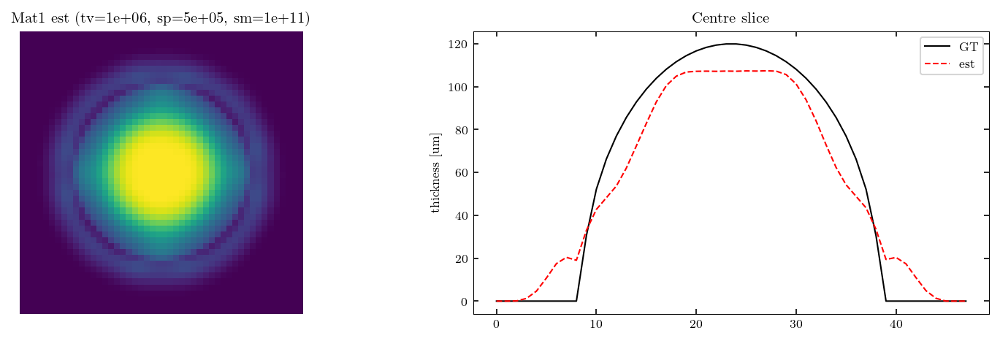

CPU times: user 1h 5min 51s, sys: 7min 38s, total: 1h 13min 30s
Wall time: 34min 43s


In [15]:
#ANTES CODE FINE SWEEP V4 NOW W/ GAUSSIAN PENALTY
%%time
# Fine sweep with Laplacian smoothness to suppress diffraction ring oscillations
LRATE          = 1e-6
max_iter       = 10000
T2_FIXED       = 4e-2

w_tv1_sweep    = [5e5, 1e6]
w_sparse_sweep = [5e5, 1e6, 5e6] 
w_smooth_sweep = [1e10, 5e10, 1e11]

def gaussian_smooth_penalty(x):
    dxx = jnp.diff(x, n=2, axis=0, append=x[-2:, :])
    dyy = jnp.diff(x, n=2, axis=1, append=x[:, -2:])
    return jnp.mean(dxx**2 + dyy**2)

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

best_score  = jnp.inf
best_w_tv1  = None
best_sparse = None
best_smooth = None
best_params = None

for w_tv1 in w_tv1_sweep:
    for w_sparse in w_sparse_sweep:
        for w_smooth in w_smooth_sweep:

            def loss_fn_t1only(t1_params, data):
                t1 = t1_params['params']['tmap'][0]
                t2 = jnp.full_like(t1, T2_FIXED)
                tmap_fixed = jnp.stack([t1, t2], axis=0)
                y_k      = model.apply({'params': {'tmap': tmap_fixed}})
                fidelity = poisson_nll(y_k, data)
                tv1      = w_tv1    * TV(t1) / t1.size
                sparse1  = w_sparse * jnp.mean(jnp.abs(t1))
                smooth1  = w_smooth * gaussian_smooth_penalty(t1)
                return fidelity + tv1 + sparse1 + smooth1

            params    = model.init(key)
            t1_init   = params['params']['tmap'][0:1]
            t1_params = freeze({'params': {'tmap': t1_init}})

            optimizer = optax.chain(
                optax.clip_by_global_norm(5.0),
                optax.adam(learning_rate=LRATE, eps=1e-8),
            )
            opt_state = optimizer.init(t1_params)

            @jax.jit
            def update(t1_params, opt_state, data):
                loss, grads = jax.value_and_grad(loss_fn_t1only)(t1_params, data)
                updates, opt_state = optimizer.update(grads, opt_state, t1_params)
                t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
                return t1_params, opt_state, loss

            for k in range(max_iter + 1):
                t1_params, opt_state, loss_k = update(t1_params, opt_state, data)

            t1_est = t1_params['params']['tmap'][0]
            t1_gt  = tmap_phantom_opt[0]
            rmse1  = float(jnp.sqrt(jnp.mean((t1_est - t1_gt)**2)))
            rel1   = float(jnp.mean(jnp.abs(t1_est - t1_gt)) / (jnp.mean(jnp.abs(t1_gt)) + 1e-12))
            score  = rmse1 / (t1_gt.max() + 1e-12)
            print(f'w_tv1={w_tv1:.0e}, w_sparse={w_sparse:.0e}, w_smooth={w_smooth:.0e} | '
                  f'RMSE={rmse1*1e6:.1f} um | rel={rel1*100:.1f}% | score={score:.3f}')

            if score < best_score:
                best_score  = score
                best_w_tv1  = w_tv1
                best_sparse = w_sparse
                best_smooth = w_smooth
                best_params = jax.tree_util.tree_map(lambda x: x.copy(), t1_params)

print(f'\nBest: w_tv1={best_w_tv1:.0e}, w_sparse={best_sparse:.0e}, '
      f'w_smooth={best_smooth:.0e} (score={best_score:.3f})')

#plot best result
t1_est = best_params['params']['tmap'][0]
t1_gt  = tmap_phantom_opt[0]
mid    = t1_est.shape[0] // 2

fig, axes = plt.subplots(1, 2, figsize=[10, 3], dpi=150, layout='constrained')
axes[0].imshow(t1_est * 1e6, cmap='viridis')
axes[0].set_title(f'Mat1 est (tv={best_w_tv1:.0e}, sp={best_sparse:.0e}, sm={best_smooth:.0e})')
axes[0].axis('off')

axes[1].plot(t1_gt[mid]  * 1e6, color='k', label='GT')
axes[1].plot(t1_est[mid] * 1e6, color='r', linestyle='--', label='est')
axes[1].set_ylabel('thickness [um]')
axes[1].set_title('Centre slice')
axes[1].legend()
plt.show()

w_tv1=5e+05, w_sparse=5e+05, w_smooth=5e+10 | RMSE=13.3 um | rel=34.7% | score=0.111
w_tv1=5e+05, w_sparse=5e+05, w_smooth=1e+11 | RMSE=12.9 um | rel=34.7% | score=0.108
w_tv1=5e+05, w_sparse=5e+05, w_smooth=5e+11 | RMSE=11.9 um | rel=32.5% | score=0.099
w_tv1=5e+05, w_sparse=1e+06, w_smooth=5e+10 | RMSE=16.3 um | rel=40.0% | score=0.136
w_tv1=5e+05, w_sparse=1e+06, w_smooth=1e+11 | RMSE=15.0 um | rel=37.4% | score=0.125
w_tv1=5e+05, w_sparse=1e+06, w_smooth=5e+11 | RMSE=14.9 um | rel=36.3% | score=0.124
w_tv1=1e+06, w_sparse=5e+05, w_smooth=5e+10 | RMSE=12.8 um | rel=33.8% | score=0.107
w_tv1=1e+06, w_sparse=5e+05, w_smooth=1e+11 | RMSE=13.0 um | rel=35.6% | score=0.109
w_tv1=1e+06, w_sparse=5e+05, w_smooth=5e+11 | RMSE=12.0 um | rel=33.1% | score=0.100
w_tv1=1e+06, w_sparse=1e+06, w_smooth=5e+10 | RMSE=16.1 um | rel=38.9% | score=0.134
w_tv1=1e+06, w_sparse=1e+06, w_smooth=1e+11 | RMSE=15.7 um | rel=39.2% | score=0.131
w_tv1=1e+06, w_sparse=1e+06, w_smooth=5e+11 | RMSE=15.3 um | rel=

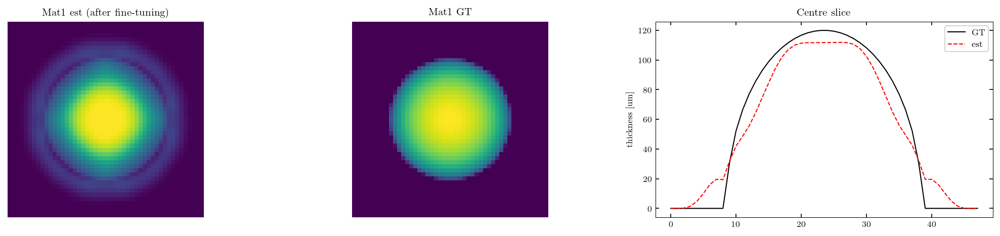

CPU times: user 1h 57min 27s, sys: 13min 34s, total: 2h 11min 1s
Wall time: 1h 3min 51s


In [16]:
#ANTES CODE FINE SWEEP V5 FINER PARAMS
%%time
LRATE          = 1e-6
max_iter       = 20000
T2_FIXED       = 4e-2

w_tv1_sweep    = [5e5, 1e6]
w_sparse_sweep = [5e5, 1e6]
w_smooth_sweep = [5e10, 1e11, 5e11]

def gaussian_smooth_penalty(x):
    dxx = jnp.diff(x, n=2, axis=0, append=x[-2:, :])
    dyy = jnp.diff(x, n=2, axis=1, append=x[:, -2:])
    return jnp.mean(dxx**2 + dyy**2)

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

best_score  = jnp.inf
best_w_tv1  = None
best_sparse = None
best_smooth = None
best_params = None

for w_tv1 in w_tv1_sweep:
    for w_sparse in w_sparse_sweep:
        for w_smooth in w_smooth_sweep:

            def loss_fn_t1only(t1_params, data):
                t1 = t1_params['params']['tmap'][0]
                t2 = jnp.full_like(t1, T2_FIXED)
                tmap_fixed = jnp.stack([t1, t2], axis=0)
                y_k      = model.apply({'params': {'tmap': tmap_fixed}})
                fidelity = poisson_nll(y_k, data)
                tv1      = w_tv1    * TV(t1) / t1.size
                sparse1  = w_sparse * jnp.mean(jnp.abs(t1))
                smooth1  = w_smooth * gaussian_smooth_penalty(t1)
                return fidelity + tv1 + sparse1 + smooth1

            params    = model.init(key)
            t1_init   = params['params']['tmap'][0:1]
            t1_params = freeze({'params': {'tmap': t1_init}})

            # Cosine decay: start high to recover amplitude, decay to fine-tune
            schedule = optax.cosine_decay_schedule(
                init_value  = 1e-5,
                decay_steps = max_iter,
                alpha       = 0.01     # final lr = 1e-5 * 0.01 = 1e-7
            )
            optimizer = optax.chain(
                optax.clip_by_global_norm(5.0),
                optax.adam(learning_rate=schedule, eps=1e-8),
            )
            opt_state = optimizer.init(t1_params)

            @jax.jit
            def update(t1_params, opt_state, data):
                loss, grads = jax.value_and_grad(loss_fn_t1only)(t1_params, data)
                updates, opt_state = optimizer.update(grads, opt_state, t1_params)
                t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
                return t1_params, opt_state, loss

            for k in range(max_iter + 1):
                t1_params, opt_state, loss_k = update(t1_params, opt_state, data)

            t1_est = t1_params['params']['tmap'][0]
            t1_gt  = tmap_phantom_opt[0]
            rmse1  = float(jnp.sqrt(jnp.mean((t1_est - t1_gt)**2)))
            rel1   = float(jnp.mean(jnp.abs(t1_est - t1_gt)) / (jnp.mean(jnp.abs(t1_gt)) + 1e-12))
            score  = rmse1 / (t1_gt.max() + 1e-12)
            print(f'w_tv1={w_tv1:.0e}, w_sparse={w_sparse:.0e}, w_smooth={w_smooth:.0e} | '
                  f'RMSE={rmse1*1e6:.1f} um | rel={rel1*100:.1f}% | score={score:.3f}')

            if score < best_score:
                best_score  = score
                best_w_tv1  = w_tv1
                best_sparse = w_sparse
                best_smooth = w_smooth
                best_params = jax.tree_util.tree_map(lambda x: x.copy(), t1_params)

print(f'\nBest: w_tv1={best_w_tv1:.0e}, w_sparse={best_sparse:.0e}, '
      f'w_smooth={best_smooth:.0e} (score={best_score:.3f})')

# ---- fine-tuning pass from best params ----
print('\nRunning fine-tuning pass from best params...')
t1_params = freeze({'params': {'tmap': best_params['params']['tmap']}})

w_tv1    = best_w_tv1
w_sparse = best_sparse
w_smooth = best_smooth * 0.5   # slightly less smoothing to recover amplitude

def loss_fn_t1only_finetune(t1_params, data):
    t1 = t1_params['params']['tmap'][0]
    t2 = jnp.full_like(t1, T2_FIXED)
    tmap_fixed = jnp.stack([t1, t2], axis=0)
    y_k      = model.apply({'params': {'tmap': tmap_fixed}})
    fidelity = poisson_nll(y_k, data)
    tv1      = w_tv1    * TV(t1) / t1.size
    sparse1  = w_sparse * jnp.mean(jnp.abs(t1))
    smooth1  = w_smooth * gaussian_smooth_penalty(t1)
    return fidelity + tv1 + sparse1 + smooth1

optimizer_ft = optax.chain(
    optax.clip_by_global_norm(5.0),
    optax.adam(learning_rate=1e-7, eps=1e-8),  # low lr for fine tuning
)
opt_state_ft = optimizer_ft.init(t1_params)

@jax.jit
def update_ft(t1_params, opt_state, data):
    loss, grads = jax.value_and_grad(loss_fn_t1only_finetune)(t1_params, data)
    updates, opt_state = optimizer_ft.update(grads, opt_state, t1_params)
    t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
    return t1_params, opt_state, loss

for k in range(5000 + 1):
    t1_params, opt_state_ft, loss_k = update_ft(t1_params, opt_state_ft, data)

# Score after fine-tuning
t1_est = t1_params['params']['tmap'][0]
t1_gt  = tmap_phantom_opt[0]
rmse1  = float(jnp.sqrt(jnp.mean((t1_est - t1_gt)**2)))
rel1   = float(jnp.mean(jnp.abs(t1_est - t1_gt)) / (jnp.mean(jnp.abs(t1_gt)) + 1e-12))
score  = rmse1 / (t1_gt.max() + 1e-12)
print(f'After fine-tuning: RMSE={rmse1*1e6:.1f} um | rel={rel1*100:.1f}% | score={score:.3f}')
print(f'Peak est: {float(t1_est.max())*1e6:.1f} um  vs  GT: {float(t1_gt.max())*1e6:.1f} um')
print(f'Background mean (where GT=0): {float(t1_est[t1_gt < 1e-8].mean())*1e6:.2f} um')

# ---- plot final result ----
mid = t1_est.shape[0] // 2
fig, axes = plt.subplots(1, 3, figsize=[14, 3], dpi=150, layout='constrained')

axes[0].imshow(t1_est * 1e6, cmap='viridis')
axes[0].set_title('Mat1 est (after fine-tuning)')
axes[0].axis('off')

axes[1].imshow(t1_gt * 1e6, cmap='viridis')
axes[1].set_title('Mat1 GT')
axes[1].axis('off')

axes[2].plot(t1_gt[mid]  * 1e6, color='k', label='GT')
axes[2].plot(t1_est[mid] * 1e6, color='r', linestyle='--', label='est')
axes[2].set_ylabel('thickness [um]')
axes[2].set_title('Centre slice')
axes[2].legend()
plt.show()

Stage 1: amplitude recovery...
Stage 1 peak: 122.6 um  vs  GT: 119.9 um
Stage 2: background cleanup...
Final: RMSE=11.9 um | rel=32.5% | score=0.099
Peak est: 113.5 um  vs  GT: 119.9 um
Background mean (where GT=0): 4.56 um


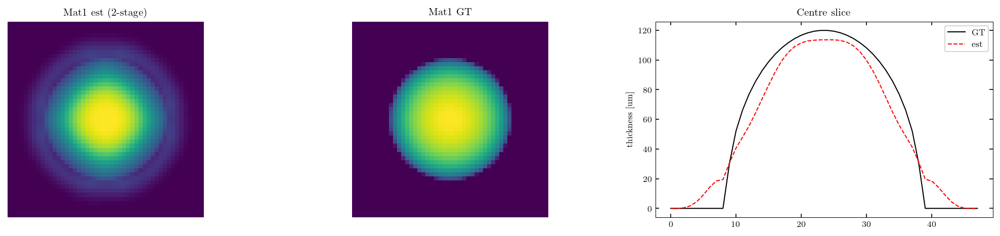

CPU times: user 8min 44s, sys: 1min 2s, total: 9min 47s
Wall time: 4min 35s


In [17]:
#ANTES CODE FINE SWEEP V6 USING BEST PARAMS FROM V5 WITH MORE ITERATIONS
%%time
LRATE    = 1e-6
max_iter = 20000
T2_FIXED = 4e-2

# Use best params from previous sweep as starting point
w_tv1    = 5e5
w_sparse = 5e5
w_smooth = 5e11

def gaussian_smooth_penalty(x):
    dxx = jnp.diff(x, n=2, axis=0, append=x[-2:, :])
    dyy = jnp.diff(x, n=2, axis=1, append=x[:, -2:])
    return jnp.mean(dxx**2 + dyy**2)

key     = jax.random.PRNGKey(3)
model   = MultiMatProjectionOpt()
forward = jax.jit(model.apply)

# ---- Stage 1: recover amplitude with cosine decay ----
print('Stage 1: amplitude recovery...')

def loss_fn_stage1(t1_params, data):
    t1 = t1_params['params']['tmap'][0]
    t2 = jnp.full_like(t1, T2_FIXED)
    tmap_fixed = jnp.stack([t1, t2], axis=0)
    y_k      = model.apply({'params': {'tmap': tmap_fixed}})
    fidelity = poisson_nll(y_k, data)
    tv1      = w_tv1    * TV(t1) / t1.size
    sparse1  = w_sparse * 0.1 * jnp.mean(jnp.abs(t1))  # 10x lower sparsity -- let amplitude grow
    smooth1  = w_smooth * gaussian_smooth_penalty(t1)
    return fidelity + tv1 + sparse1 + smooth1

params    = model.init(key)
t1_init   = params['params']['tmap'][0:1]
t1_params = freeze({'params': {'tmap': t1_init}})

schedule1 = optax.cosine_decay_schedule(
    init_value  = 1e-5,
    decay_steps = max_iter,
    alpha       = 0.01
)
optimizer1 = optax.chain(
    optax.clip_by_global_norm(5.0),
    optax.adam(learning_rate=schedule1, eps=1e-8),
)
opt_state1 = optimizer1.init(t1_params)

@jax.jit
def update1(t1_params, opt_state, data):
    loss, grads = jax.value_and_grad(loss_fn_stage1)(t1_params, data)
    updates, opt_state = optimizer1.update(grads, opt_state, t1_params)
    t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
    return t1_params, opt_state, loss

for k in range(max_iter + 1):
    t1_params, opt_state1, loss_k = update1(t1_params, opt_state1, data)

t1_est = t1_params['params']['tmap'][0]
t1_gt  = tmap_phantom_opt[0]
print(f'Stage 1 peak: {float(t1_est.max())*1e6:.1f} um  vs  GT: {float(t1_gt.max())*1e6:.1f} um')

# ---- Stage 2: clean up background with full sparsity ----
print('Stage 2: background cleanup...')

def loss_fn_stage2(t1_params, data):
    t1 = t1_params['params']['tmap'][0]
    t2 = jnp.full_like(t1, T2_FIXED)
    tmap_fixed = jnp.stack([t1, t2], axis=0)
    y_k      = model.apply({'params': {'tmap': tmap_fixed}})
    fidelity = poisson_nll(y_k, data)
    tv1      = w_tv1    * TV(t1) / t1.size
    sparse1  = w_sparse * jnp.mean(jnp.abs(t1))   # full sparsity back
    smooth1  = w_smooth * gaussian_smooth_penalty(t1)
    return fidelity + tv1 + sparse1 + smooth1

optimizer2 = optax.chain(
    optax.clip_by_global_norm(5.0),
    optax.adam(learning_rate=1e-7, eps=1e-8),  # low lr to not disturb amplitude
)
opt_state2 = optimizer2.init(t1_params)

@jax.jit
def update2(t1_params, opt_state, data):
    loss, grads = jax.value_and_grad(loss_fn_stage2)(t1_params, data)
    updates, opt_state = optimizer2.update(grads, opt_state, t1_params)
    t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
    return t1_params, opt_state, loss

for k in range(5000 + 1):
    t1_params, opt_state2, loss_k = update2(t1_params, opt_state2, data)

# ---- final metrics ----
t1_est = t1_params['params']['tmap'][0]
rmse1  = float(jnp.sqrt(jnp.mean((t1_est - t1_gt)**2)))
rel1   = float(jnp.mean(jnp.abs(t1_est - t1_gt)) / (jnp.mean(jnp.abs(t1_gt)) + 1e-12))
score  = rmse1 / (t1_gt.max() + 1e-12)
print(f'Final: RMSE={rmse1*1e6:.1f} um | rel={rel1*100:.1f}% | score={score:.3f}')
print(f'Peak est: {float(t1_est.max())*1e6:.1f} um  vs  GT: {float(t1_gt.max())*1e6:.1f} um')
print(f'Background mean (where GT=0): {float(t1_est[t1_gt < 1e-8].mean())*1e6:.2f} um')

# ---- plot ----
mid = t1_est.shape[0] // 2
fig, axes = plt.subplots(1, 3, figsize=[14, 3], dpi=150, layout='constrained')

axes[0].imshow(t1_est * 1e6, cmap='viridis')
axes[0].set_title('Mat1 est (2-stage)')
axes[0].axis('off')

axes[1].imshow(t1_gt * 1e6, cmap='viridis')
axes[1].set_title('Mat1 GT')
axes[1].axis('off')

axes[2].plot(t1_gt[mid]  * 1e6, color='k', label='GT')
axes[2].plot(t1_est[mid] * 1e6, color='r', linestyle='--', label='est')
axes[2].set_ylabel('thickness [um]')
axes[2].set_title('Centre slice')
axes[2].legend()
plt.show()

Stage 2: background cleanup...
Calc pixels: 716 / 2304
  iter 0: peak=113.6 um, bg=4.56 um
  iter 1000: peak=122.1 um, bg=5.10 um
  iter 2000: peak=122.1 um, bg=5.10 um
  iter 3000: peak=122.1 um, bg=5.10 um
  iter 4000: peak=122.1 um, bg=5.10 um
  iter 5000: peak=122.1 um, bg=5.10 um

Final: RMSE=9.8 um | rel=25.9% | score=0.082
Peak est: 122.1 um  vs  GT: 119.9 um
Background mean (where GT=0): 5.10 um


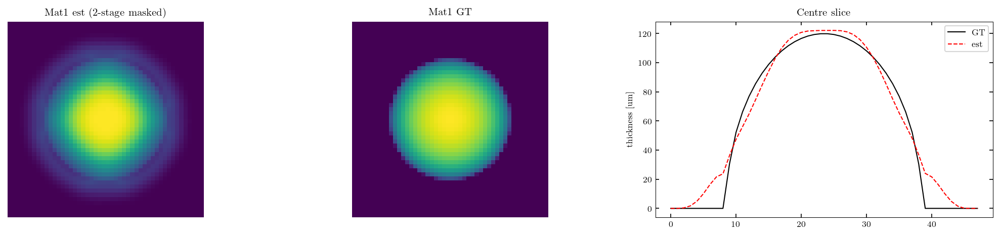

In [18]:
#ANTES CODE FINE SWEEP V7 try to get background more zero

# Penalty for pixels that are outside the 'true object'
t1_stage1   = t1_params['params']['tmap'][0]
radius_mask = tmap_phantom_opt[0] > 1e-8   # True where GT calc exists
print(f'Calc pixels: {int(radius_mask.sum())} / {radius_mask.size}')

def loss_fn_stage2(t1_params, data):
    t1 = t1_params['params']['tmap'][0]
    t2 = jnp.full_like(t1, T2_FIXED)
    tmap_fixed = jnp.stack([t1, t2], axis=0)
    y_k      = model.apply({'params': {'tmap': tmap_fixed}})
    fidelity = poisson_nll(y_k, data)
    tv1      = w_tv1 * TV(t1) / t1.size
    smooth1  = w_smooth * gaussian_smooth_penalty(t1)

    # Only apply sparsity OUTSIDE the calcification region
    background_pixels = t1 * (~radius_mask).astype(t1.dtype)
    sparse_bg = w_sparse * jnp.mean(jnp.abs(background_pixels))

    return fidelity + tv1 + smooth1 + sparse_bg

optimizer2 = optax.chain(
    optax.clip_by_global_norm(5.0),
    optax.adam(learning_rate=5e-8, eps=1e-8),  # very low lr
)
opt_state2 = optimizer2.init(t1_params)

@jax.jit
def update2(t1_params, opt_state, data):
    loss, grads = jax.value_and_grad(loss_fn_stage2)(t1_params, data)
    updates, opt_state = optimizer2.update(grads, opt_state, t1_params)
    t1_params = projection_non_negative(optax.apply_updates(t1_params, updates))
    return t1_params, opt_state, loss

for k in range(5000 + 1):
    t1_params, opt_state2, loss_k = update2(t1_params, opt_state2, data)
    if k % 1000 == 0:
        t1_now = t1_params['params']['tmap'][0]
        print(f'  iter {k}: peak={float(t1_now.max())*1e6:.1f} um, '
              f'bg={float(t1_now[~radius_mask].mean())*1e6:.2f} um')


t1_est = t1_params['params']['tmap'][0]
t1_gt  = tmap_phantom_opt[0]
rmse1  = float(jnp.sqrt(jnp.mean((t1_est - t1_gt)**2)))
rel1   = float(jnp.mean(jnp.abs(t1_est - t1_gt)) / (jnp.mean(jnp.abs(t1_gt)) + 1e-12))
score  = rmse1 / (t1_gt.max() + 1e-12)
print(f'\nFinal: RMSE={rmse1*1e6:.1f} um | rel={rel1*100:.1f}% | score={score:.3f}')
print(f'Peak est: {float(t1_est.max())*1e6:.1f} um  vs  GT: {float(t1_gt.max())*1e6:.1f} um')
print(f'Background mean (where GT=0): {float(t1_est[~radius_mask].mean())*1e6:.2f} um')

#plot
mid = t1_est.shape[0] // 2
fig, axes = plt.subplots(1, 3, figsize=[14, 3], dpi=150, layout='constrained')

axes[0].imshow(t1_est * 1e6, cmap='viridis')
axes[0].set_title('Mat1 est (2-stage masked)')
axes[0].axis('off')

axes[1].imshow(t1_gt * 1e6, cmap='viridis')
axes[1].set_title('Mat1 GT')
axes[1].axis('off')

axes[2].plot(t1_gt[mid]  * 1e6, color='k', label='GT')
axes[2].plot(t1_est[mid] * 1e6, color='r', linestyle='--', label='est')
axes[2].set_ylabel('thickness [um]')
axes[2].set_title('Centre slice')
axes[2].legend()
plt.show()

In [21]:
# How many opt pixels does the calcification edge span? 
mid = t1_gt.shape[0] // 2
gt_slice = t1_gt[mid] * 1e6
edge_width_gt  = int(jnp.sum(gt_slice > 1.0))   # pixels where GT > 1 um
edge_width_est = int(jnp.sum(t1_thresh[mid] * 1e6 > 1.0))
print(f'GT edge width:  {edge_width_gt} pixels = {edge_width_gt * model.det_dx*1e6:.0f} um')
print(f'Est edge width: {edge_width_est} pixels = {edge_width_est * model.det_dx*1e6:.0f} um')
print(f'Resolution limit: {model.det_dx*1e6:.0f} um per pixel')

mean_energy_keV = float(jnp.sum(spectrum[0] * spectrum[1]))  # mean photon energy
mean_wavelen    = float(get_wavelen(jnp.array([mean_energy_keV]))[0])
propdist        = MultiMatProjectionOpt.propdist

fringe_width = np.sqrt(mean_wavelen * propdist)
print(f'Mean energy:    {mean_energy_keV:.1f} keV')
print(f'Mean wavelength: {mean_wavelen*1e12:.4f} pm')
print(f'Propagation distance: {propdist*1e3:.0f} mm')
print(f'Fresnel fringe width: {fringe_width*1e6:.1f} um')
print(f'Fringe width in opt pixels: {fringe_width/model.det_dx:.1f} pixels')

GT edge width:  30 pixels = 120 um
Est edge width: 38 pixels = 152 um
Resolution limit: 4 um per pixel
Mean energy:    31.4 keV
Mean wavelength: 39.4542 pm
Propagation distance: 50 mm
Fresnel fringe width: 1.4 um
Fringe width in opt pixels: 0.4 pixels
